In [248]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

/bin/bash: line 1: nvidia-smi: command not found


In [249]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 37.8 gigabytes of available RAM

You are using a high-RAM runtime!


In [250]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [251]:
import plotly.express as px
import seaborn as sns

In [252]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [253]:
import statsmodels.api as sm

In [254]:
import scipy.stats as stats

In [255]:
# Set up path this way to be operating system independent, also easier for file management later in the project

from google.colab import files
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import io
import os
uploaded = files.upload()


Saving 2023_smd_hourly.xlsx to 2023_smd_hourly (1).xlsx


In [256]:
df=pd.read_excel(open("2023_smd_hourly.xlsx", 'rb'), sheet_name="ISO NE CA")

In [257]:
df["DA_Demand_scaled"]=(df["DA_Demand"]-df["DA_Demand"].min())/(df["DA_Demand"].max()-df["DA_Demand"].min())

In [258]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2880 entries, 0 to 2879
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                2880 non-null   datetime64[ns]
 1   Hr_End              2880 non-null   int64         
 2   DA_Demand           2880 non-null   float64       
 3   RT_Demand           2880 non-null   float64       
 4   DA_LMP              2880 non-null   float64       
 5   DA_EC               2880 non-null   float64       
 6   DA_CC               2880 non-null   float64       
 7   DA_MLC              2880 non-null   float64       
 8   RT_LMP              2880 non-null   float64       
 9   RT_EC               2880 non-null   float64       
 10  RT_CC               2880 non-null   float64       
 11  RT_MLC              2880 non-null   float64       
 12  Dry_Bulb            2880 non-null   int64         
 13  Dew_Point           2880 non-null   int64       

In [259]:
len

<function len(obj, /)>

In [260]:
len(df["Date"].value_counts())

120

In [261]:
len(df["Date"].value_counts()==24)

120

In [262]:
df['datetime'] = df['Date'] + pd.to_timedelta(df['Hr_End'], unit='h')

In [263]:
df

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,...,Dew_Point,System_Load,Reg_Service_Price,Reg_Capacity_Price,Min_5min_RSP,Max_5min_RSP,Min_5min_RCP,Max_5min_RCP,DA_Demand_scaled,datetime
0,2023-01-01,1,9565.9,10277.283,31.27,31.28,0.00,-0.01,36.99,36.93,...,49,10496,0.050000,24.250000,0.05,0.05,13.22,79.40,0.176569,2023-01-01 01:00:00
1,2023-01-01,2,9063.3,9835.916,28.42,28.44,0.00,-0.02,33.45,33.39,...,49,10042,0.005000,1.700833,0.00,0.05,0.00,13.22,0.136117,2023-01-01 02:00:00
2,2023-01-01,3,9107.0,9494.592,26.81,26.83,0.00,-0.02,32.19,32.09,...,49,9705,0.000000,0.000000,0.00,0.00,0.00,0.00,0.139634,2023-01-01 03:00:00
3,2023-01-01,4,9056.7,9311.012,28.17,28.19,0.00,-0.02,31.89,31.75,...,49,9518,0.000000,0.000000,0.00,0.00,0.00,0.00,0.135586,2023-01-01 04:00:00
4,2023-01-01,5,9409.2,9284.351,29.67,29.70,0.00,-0.03,31.93,31.80,...,48,9496,0.000000,33.800000,0.00,0.00,0.00,40.56,0.163957,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,12477.3,12898.131,33.84,33.57,0.06,0.21,30.57,30.21,...,48,13217,0.240000,11.876667,0.19,0.25,11.43,15.69,0.410895,2023-04-30 20:00:00
2876,2023-04-30,21,12160.8,12507.431,30.59,30.27,0.12,0.20,22.92,22.63,...,49,12830,0.250000,10.986667,0.25,0.25,10.94,11.50,0.385421,2023-04-30 21:00:00
2877,2023-04-30,22,11498.0,11758.851,25.74,25.53,0.08,0.13,17.55,17.29,...,50,12050,0.250000,8.877500,0.25,0.25,8.69,10.94,0.332075,2023-04-30 22:00:00
2878,2023-04-30,23,10464.8,10873.363,24.12,23.94,0.06,0.12,21.44,21.11,...,50,11127,0.083333,37.073333,0.05,0.25,8.72,40.32,0.248917,2023-04-30 23:00:00


In [264]:
fig = px.line(df, x='datetime', y="DA_Demand")
fig.show()

In [265]:
fig = px.line(df, x='datetime', y="RT_Demand")
fig.show()

In [266]:
df["DA_RT"]=df["DA_Demand"]-df["RT_Demand"]

In [267]:
fig = px.line(df, x='datetime', y="DA_RT")
fig.show()

In [268]:
df["DA_RT"].mean()    #

-252.66416909722219

In [269]:
df["DA_RT"].std()

679.9641983508012

In [270]:
fig = px.scatter(df, x='DA_LMP', y="RT_LMP")
fig.add_shape(type='line',
              x0=1,
              y0=1,
              x1=350,
              y1=400,
              line=dict(color='red', width=2, dash='dash')
              )
fig.show()

In [271]:
(df["DA_LMP"]-df["RT_LMP"]).mean()

2.0951354166666665

In [272]:
(df["DA_LMP"]-df["RT_LMP"]).std()

23.832726492851798

In [273]:
df["cost"]=df["DA_Demand"]*df["DA_LMP"]-df["RT_Demand"]*df["RT_LMP"]

In [274]:
fig = px.line(df, x='datetime', y="cost")
fig.show()

In [275]:
df["cost"].mean()

14398.654654888896

In [276]:
df["cost"].median()

31356.888359999954

In [277]:
df["cost"].std()

374773.00366644474

In [278]:
std_cost=(df["cost"]-df["cost"].mean())/df["cost"].std()

In [279]:
std_cost

0      -0.254633
1      -0.229021
2      -0.202445
3      -0.149956
4      -0.084523
          ...   
2875    0.036121
2876    0.189261
2877    0.200634
2878    0.013041
2879   -0.036093
Name: cost, Length: 2880, dtype: float64

(array([2.000e+00, 5.000e+00, 4.000e+00, 7.000e+00, 3.000e+01, 1.280e+02,
        2.481e+03, 1.910e+02, 2.100e+01, 1.100e+01]),
 array([-11.451563  ,  -9.70818333,  -7.96480367,  -6.22142401,
         -4.47804435,  -2.73466468,  -0.99128502,   0.75209464,
          2.4954743 ,   4.23885397,   5.98223363]),
 <BarContainer object of 10 artists>)

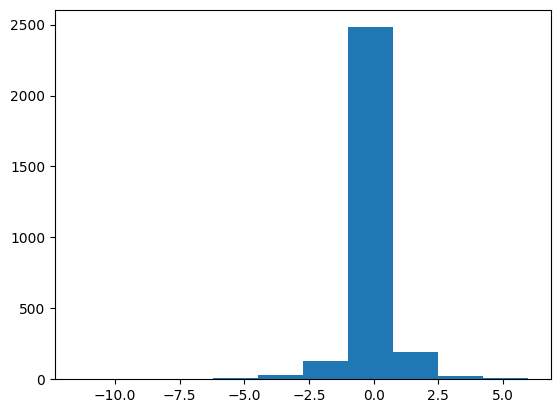

In [280]:
plt.hist(std_cost)

In [281]:
df["RTcost"]=(-df["DA_Demand"]+df["RT_Demand"])*abs(df["RT_LMP"])

In [282]:
df["RT_LMP"]

0       36.99
1       33.45
2       32.19
3       31.89
4       31.93
        ...  
2875    30.57
2876    22.92
2877    17.55
2878    21.44
2879    18.54
Name: RT_LMP, Length: 2880, dtype: float64

In [283]:
(-df["DA_Demand"]+df["RT_Demand"])*abs(df["RT_LMP"])

0       26314.05717
1       25844.00520
2       12476.58648
3        8110.00968
4       -3986.42857
           ...     
2875    12864.80367
2876     7944.78252
2877     4577.93505
2878     8759.59072
2879    11372.99220
Length: 2880, dtype: float64

In [284]:
fig = px.line(df, x='datetime', y="RTcost")
fig.show()

In [285]:
fig = px.line(df, x='datetime', y="RT_LMP")
fig.show()

## The total consumption is lowest for VT, so lets check the correlation between demand and LMPs

In [286]:
df_VT=pd.read_excel(open("2023_smd_hourly.xlsx", 'rb'), sheet_name="VT")
df_VT['datetime'] = df_VT['Date'] + pd.to_timedelta(df_VT['Hr_End'], unit='h')

In [287]:
df_VT.head()

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC,Dry_Bulb,Dew_Point,datetime
0,2023-01-01,1,478.7,501.150,30.42,31.28,0.0,-0.86,36.32,36.93,0.00,-0.61,51,50,2023-01-01 01:00:00
1,2023-01-01,2,451.1,477.935,27.67,28.44,0.0,-0.77,32.94,33.39,0.00,-0.45,51,49,2023-01-01 02:00:00
2,2023-01-01,3,454.7,459.938,26.14,26.83,0.0,-0.69,31.32,32.09,0.00,-0.77,50,49,2023-01-01 03:00:00
3,2023-01-01,4,457.2,449.098,27.50,28.19,0.0,-0.69,30.59,31.75,-0.17,-0.99,49,47,2023-01-01 04:00:00
4,2023-01-01,5,455.5,448.869,29.00,29.70,0.0,-0.70,30.83,31.80,0.00,-0.97,49,47,2023-01-01 05:00:00


In [288]:
df_VT_scaled=df_VT.copy()

In [289]:
df_VT_scaled.iloc[:,[2,3,4,5,6,7,8,9,10]].std(axis=0)

DA_Demand    142.107333
RT_Demand    130.712183
DA_LMP        35.485662
DA_EC         35.833203
DA_CC          2.313702
DA_MLC         0.894920
RT_LMP        41.280504
RT_EC         41.326475
RT_CC          0.267038
dtype: float64

In [290]:
df_VT_scaled.iloc[:,range(2,12)]=(df_VT_scaled.iloc[:,range(2,12)]-
                                  df_VT_scaled.iloc[:,range(2,12)].min(axis=0))/(df_VT_scaled.iloc[:,range(2,12)].max(axis=0)-df_VT_scaled.iloc[:,range(2,12)].min(axis=0))  #scale date in the range of 0 1 for all columnts

In [291]:
df_VT_scaled.iloc[:,range(2,12)]

,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC
0,0.572948,0.465955,0.047075,0.050436,0.644173,0.338040,0.221872,0.226268,0.740904,0.408245
1,0.543296,0.435665,0.038369,0.041306,0.644173,0.345515,0.215758,0.219788,0.740904,0.416290
2,0.547164,0.412183,0.033525,0.036131,0.644173,0.352159,0.212827,0.217408,0.740904,0.400201
3,0.549850,0.398040,0.037831,0.040503,0.644173,0.352159,0.211506,0.216786,0.722161,0.389140
4,0.548023,0.397741,0.042579,0.045357,0.644173,0.351329,0.211940,0.216877,0.740904,0.390146
...,...,...,...,...,...,...,...,...,...,...
2875,0.597550,0.586475,0.053691,0.057797,0.641064,0.343854,0.208865,0.213967,0.713341,0.397185
2876,0.591749,0.561525,0.044511,0.047189,0.643828,0.357143,0.196110,0.200092,0.739802,0.411765
2877,0.583154,0.521404,0.029853,0.031952,0.645094,0.357143,0.187028,0.190317,0.755237,0.420814
2878,0.532015,0.470538,0.026909,0.026841,0.644864,0.413621,0.194337,0.197309,0.766262,0.426848


In [292]:
df

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,...,Reg_Capacity_Price,Min_5min_RSP,Max_5min_RSP,Min_5min_RCP,Max_5min_RCP,DA_Demand_scaled,datetime,DA_RT,cost,RTcost
0,2023-01-01,1,9565.9,10277.283,31.27,31.28,0.00,-0.01,36.99,36.93,...,24.250000,0.05,0.05,13.22,79.40,0.176569,2023-01-01 01:00:00,-711.383,-81031.00517,26314.05717
1,2023-01-01,2,9063.3,9835.916,28.42,28.44,0.00,-0.02,33.45,33.39,...,1.700833,0.00,0.05,0.00,13.22,0.136117,2023-01-01 02:00:00,-772.616,-71432.40420,25844.00520
2,2023-01-01,3,9107.0,9494.592,26.81,26.83,0.00,-0.02,32.19,32.09,...,0.000000,0.00,0.00,0.00,0.00,0.139634,2023-01-01 03:00:00,-387.592,-61472.24648,12476.58648
3,2023-01-01,4,9056.7,9311.012,28.17,28.19,0.00,-0.02,31.89,31.75,...,0.000000,0.00,0.00,0.00,0.00,0.135586,2023-01-01 04:00:00,-254.312,-41800.93368,8110.00968
4,2023-01-01,5,9409.2,9284.351,29.67,29.70,0.00,-0.03,31.93,31.80,...,33.800000,0.00,0.00,0.00,40.56,0.163957,2023-01-01 05:00:00,124.849,-17278.36343,-3986.42857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,12477.3,12898.131,33.84,33.57,0.06,0.21,30.57,30.21,...,11.876667,0.19,0.25,11.43,15.69,0.410895,2023-04-30 20:00:00,-420.831,27935.96733,12864.80367
2876,2023-04-30,21,12160.8,12507.431,30.59,30.27,0.12,0.20,22.92,22.63,...,10.986667,0.25,0.25,10.94,11.50,0.385421,2023-04-30 21:00:00,-346.631,85328.55348,7944.78252
2877,2023-04-30,22,11498.0,11758.851,25.74,25.53,0.08,0.13,17.55,17.29,...,8.877500,0.25,0.25,8.69,10.94,0.332075,2023-04-30 22:00:00,-260.851,89590.68495,4577.93505
2878,2023-04-30,23,10464.8,10873.363,24.12,23.94,0.06,0.12,21.44,21.11,...,37.073333,0.05,0.25,8.72,40.32,0.248917,2023-04-30 23:00:00,-408.563,19286.07328,8759.59072


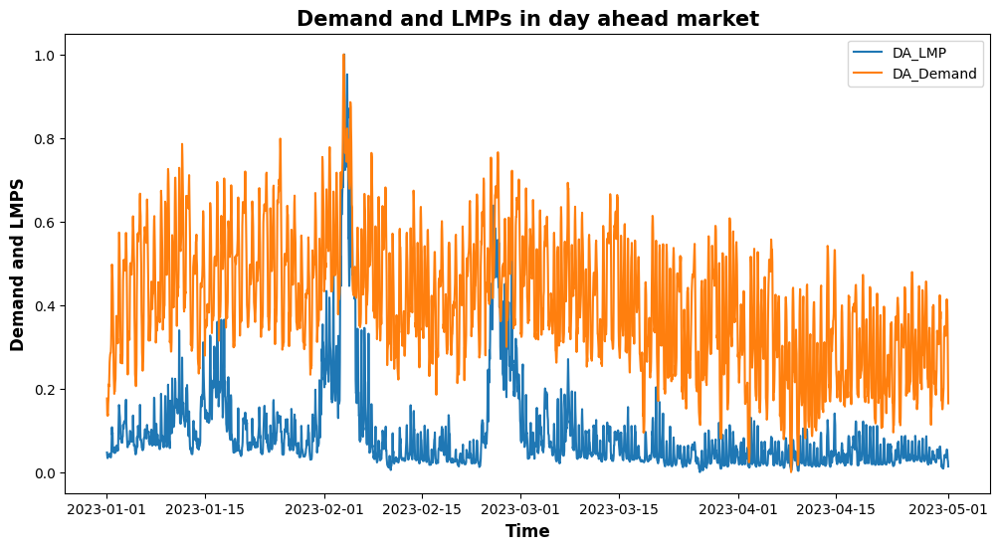

In [293]:
fig = plt.figure(figsize = (12, 6))
#sns.lineplot(data = df_VT_scaled, x = 'datetime', y ='DA_Demand', color="black")
sns.lineplot(data = df_VT_scaled, x = 'datetime', y ='DA_LMP',label='DA_LMP')
sns.lineplot(data=df, x='datetime', y='DA_Demand_scaled',label='DA_Demand')
plt.title('Demand and LMPs in day ahead market', weight='bold', fontsize = 15)
plt.ylabel('Demand and LMPS', weight='bold', fontsize = 12)
plt.xlabel('Time', weight='bold', fontsize = 12)
plt.legend()
plt.show()

In [294]:
r, p = stats.pearsonr(df.dropna()['DA_Demand_scaled'], df_VT.dropna()['DA_LMP'])
print(f"Scipy computed Pearson r: {r} and p-value: {p}")

Scipy computed Pearson r: 0.6156485535948857 and p-value: 4.152416016294907e-300


In [295]:
r, p = stats.pearsonr(df_VT.dropna()['DA_Demand'], df_VT.dropna()['DA_LMP'])
print(f"Scipy computed Pearson r: {r} and p-value: {p}")

Scipy computed Pearson r: 0.31680248434271274 and p-value: 3.7369617871827755e-68


## Time Lagged Cross Correlation — assessing signal dynamics

Time lagged cross correlation (TLCC) can identify directionality between two signals such as a leader-follower relationship in which the leader initiates a response which is repeated by the follower. There are couple ways to do investigate such relationship including Granger causality, used in Economics, but note that these still do not necessarily reflect true causality. Nonetheless we can still extract a sense of which signal occurs first by looking at cross correlations.

In [296]:
df_VT

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC,Dry_Bulb,Dew_Point,datetime
0,2023-01-01,1,478.7,501.150,30.42,31.28,0.00,-0.86,36.32,36.93,0.00,-0.61,51,50,2023-01-01 01:00:00
1,2023-01-01,2,451.1,477.935,27.67,28.44,0.00,-0.77,32.94,33.39,0.00,-0.45,51,49,2023-01-01 02:00:00
2,2023-01-01,3,454.7,459.938,26.14,26.83,0.00,-0.69,31.32,32.09,0.00,-0.77,50,49,2023-01-01 03:00:00
3,2023-01-01,4,457.2,449.098,27.50,28.19,0.00,-0.69,30.59,31.75,-0.17,-0.99,49,47,2023-01-01 04:00:00
4,2023-01-01,5,455.5,448.869,29.00,29.70,0.00,-0.70,30.83,31.80,0.00,-0.97,49,47,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,501.6,593.521,32.51,33.57,-0.27,-0.79,29.13,30.21,-0.25,-0.83,55,44,2023-04-30 20:00:00
2876,2023-04-30,21,496.2,574.398,29.61,30.27,-0.03,-0.63,22.08,22.63,-0.01,-0.54,55,43,2023-04-30 21:00:00
2877,2023-04-30,22,488.2,543.648,24.98,25.53,0.08,-0.63,17.06,17.29,0.13,-0.36,54,43,2023-04-30 22:00:00
2878,2023-04-30,23,440.6,504.663,24.05,23.94,0.06,0.05,21.10,21.11,0.23,-0.24,54,43,2023-04-30 23:00:00


In [297]:
df_VT["DA_EC"]+df["DA_CC"]+df['DA_MLC']

0       31.27
1       28.42
2       26.81
3       28.17
4       29.67
        ...  
2875    33.84
2876    30.59
2877    25.74
2878    24.12
2879    19.84
Length: 2880, dtype: float64

<Axes: >

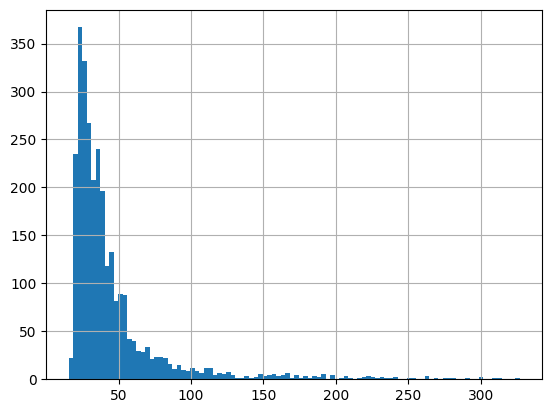

In [298]:
df_VT["DA_EC"].hist(bins=100)

<Axes: >

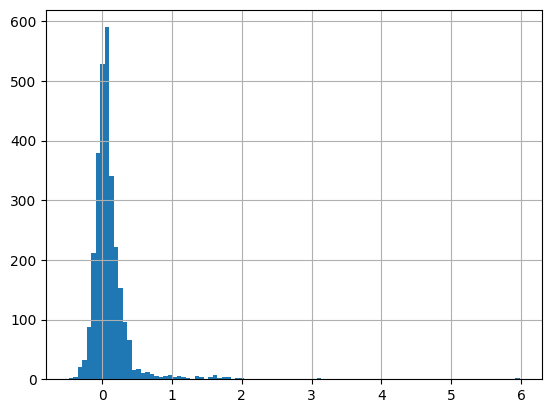

In [299]:
df["DA_MLC"].hist(bins=100)

<Axes: >

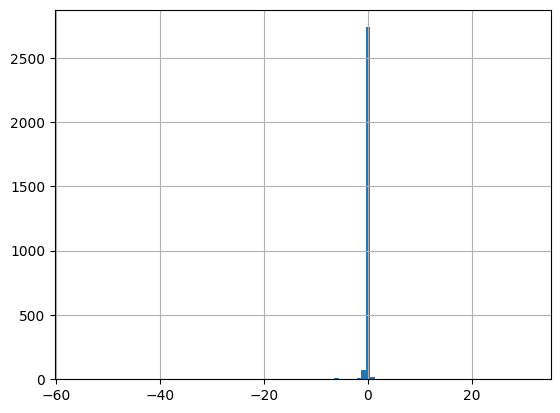

In [300]:
df_VT["DA_CC"].hist(bins=100)

### Proportion of CC and MLC for VT

In [301]:
(df_VT["DA_EC"]/df_VT["DA_LMP"]).mean()

1.0087473240846827

In [302]:
(df_VT["DA_MLC"]/df_VT["DA_LMP"]).mean()

-0.006952982753665792

In [303]:
(df_VT["DA_CC"]/df_VT["DA_LMP"]).mean()

-0.0017943413310171044

### Proportion of CC and MLC for all zones

In [304]:
(df["DA_EC"]/df["DA_LMP"]).mean()

0.9983668820996442

In [305]:
(df["DA_MLC"]/df["DA_LMP"]).mean()

0.0014709884884523483

In [306]:
(df["DA_CC"]/df["DA_LMP"]).mean()

0.00016212941190343205

In [307]:
df

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,...,Reg_Capacity_Price,Min_5min_RSP,Max_5min_RSP,Min_5min_RCP,Max_5min_RCP,DA_Demand_scaled,datetime,DA_RT,cost,RTcost
0,2023-01-01,1,9565.9,10277.283,31.27,31.28,0.00,-0.01,36.99,36.93,...,24.250000,0.05,0.05,13.22,79.40,0.176569,2023-01-01 01:00:00,-711.383,-81031.00517,26314.05717
1,2023-01-01,2,9063.3,9835.916,28.42,28.44,0.00,-0.02,33.45,33.39,...,1.700833,0.00,0.05,0.00,13.22,0.136117,2023-01-01 02:00:00,-772.616,-71432.40420,25844.00520
2,2023-01-01,3,9107.0,9494.592,26.81,26.83,0.00,-0.02,32.19,32.09,...,0.000000,0.00,0.00,0.00,0.00,0.139634,2023-01-01 03:00:00,-387.592,-61472.24648,12476.58648
3,2023-01-01,4,9056.7,9311.012,28.17,28.19,0.00,-0.02,31.89,31.75,...,0.000000,0.00,0.00,0.00,0.00,0.135586,2023-01-01 04:00:00,-254.312,-41800.93368,8110.00968
4,2023-01-01,5,9409.2,9284.351,29.67,29.70,0.00,-0.03,31.93,31.80,...,33.800000,0.00,0.00,0.00,40.56,0.163957,2023-01-01 05:00:00,124.849,-17278.36343,-3986.42857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,12477.3,12898.131,33.84,33.57,0.06,0.21,30.57,30.21,...,11.876667,0.19,0.25,11.43,15.69,0.410895,2023-04-30 20:00:00,-420.831,27935.96733,12864.80367
2876,2023-04-30,21,12160.8,12507.431,30.59,30.27,0.12,0.20,22.92,22.63,...,10.986667,0.25,0.25,10.94,11.50,0.385421,2023-04-30 21:00:00,-346.631,85328.55348,7944.78252
2877,2023-04-30,22,11498.0,11758.851,25.74,25.53,0.08,0.13,17.55,17.29,...,8.877500,0.25,0.25,8.69,10.94,0.332075,2023-04-30 22:00:00,-260.851,89590.68495,4577.93505
2878,2023-04-30,23,10464.8,10873.363,24.12,23.94,0.06,0.12,21.44,21.11,...,37.073333,0.05,0.25,8.72,40.32,0.248917,2023-04-30 23:00:00,-408.563,19286.07328,8759.59072


In [308]:
 df_VT

,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,RT_CC,RT_MLC,Dry_Bulb,Dew_Point,datetime
0,2023-01-01,1,478.7,501.150,30.42,31.28,0.00,-0.86,36.32,36.93,0.00,-0.61,51,50,2023-01-01 01:00:00
1,2023-01-01,2,451.1,477.935,27.67,28.44,0.00,-0.77,32.94,33.39,0.00,-0.45,51,49,2023-01-01 02:00:00
2,2023-01-01,3,454.7,459.938,26.14,26.83,0.00,-0.69,31.32,32.09,0.00,-0.77,50,49,2023-01-01 03:00:00
3,2023-01-01,4,457.2,449.098,27.50,28.19,0.00,-0.69,30.59,31.75,-0.17,-0.99,49,47,2023-01-01 04:00:00
4,2023-01-01,5,455.5,448.869,29.00,29.70,0.00,-0.70,30.83,31.80,0.00,-0.97,49,47,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,501.6,593.521,32.51,33.57,-0.27,-0.79,29.13,30.21,-0.25,-0.83,55,44,2023-04-30 20:00:00
2876,2023-04-30,21,496.2,574.398,29.61,30.27,-0.03,-0.63,22.08,22.63,-0.01,-0.54,55,43,2023-04-30 21:00:00
2877,2023-04-30,22,488.2,543.648,24.98,25.53,0.08,-0.63,17.06,17.29,0.13,-0.36,54,43,2023-04-30 22:00:00
2878,2023-04-30,23,440.6,504.663,24.05,23.94,0.06,0.05,21.10,21.11,0.23,-0.24,54,43,2023-04-30 23:00:00


In [309]:
df.rename(columns={'old_column_name': 'new_column_name'}, inplace=True)

In [310]:
zones=["ME","NH","VT","CT","RI","SEMA","WCMA","NEMA"]

In [311]:
zones

['ME', 'NH', 'VT', 'CT', 'RI', 'SEMA', 'WCMA', 'NEMA']

In [312]:
df.rename(columns={'old_column_name': 'new_column_name'}, inplace=True)
df


,Date,Hr_End,DA_Demand,RT_Demand,DA_LMP,DA_EC,DA_CC,DA_MLC,RT_LMP,RT_EC,...,Reg_Capacity_Price,Min_5min_RSP,Max_5min_RSP,Min_5min_RCP,Max_5min_RCP,DA_Demand_scaled,datetime,DA_RT,cost,RTcost
0,2023-01-01,1,9565.9,10277.283,31.27,31.28,0.00,-0.01,36.99,36.93,...,24.250000,0.05,0.05,13.22,79.40,0.176569,2023-01-01 01:00:00,-711.383,-81031.00517,26314.05717
1,2023-01-01,2,9063.3,9835.916,28.42,28.44,0.00,-0.02,33.45,33.39,...,1.700833,0.00,0.05,0.00,13.22,0.136117,2023-01-01 02:00:00,-772.616,-71432.40420,25844.00520
2,2023-01-01,3,9107.0,9494.592,26.81,26.83,0.00,-0.02,32.19,32.09,...,0.000000,0.00,0.00,0.00,0.00,0.139634,2023-01-01 03:00:00,-387.592,-61472.24648,12476.58648
3,2023-01-01,4,9056.7,9311.012,28.17,28.19,0.00,-0.02,31.89,31.75,...,0.000000,0.00,0.00,0.00,0.00,0.135586,2023-01-01 04:00:00,-254.312,-41800.93368,8110.00968
4,2023-01-01,5,9409.2,9284.351,29.67,29.70,0.00,-0.03,31.93,31.80,...,33.800000,0.00,0.00,0.00,40.56,0.163957,2023-01-01 05:00:00,124.849,-17278.36343,-3986.42857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-04-30,20,12477.3,12898.131,33.84,33.57,0.06,0.21,30.57,30.21,...,11.876667,0.19,0.25,11.43,15.69,0.410895,2023-04-30 20:00:00,-420.831,27935.96733,12864.80367
2876,2023-04-30,21,12160.8,12507.431,30.59,30.27,0.12,0.20,22.92,22.63,...,10.986667,0.25,0.25,10.94,11.50,0.385421,2023-04-30 21:00:00,-346.631,85328.55348,7944.78252
2877,2023-04-30,22,11498.0,11758.851,25.74,25.53,0.08,0.13,17.55,17.29,...,8.877500,0.25,0.25,8.69,10.94,0.332075,2023-04-30 22:00:00,-260.851,89590.68495,4577.93505
2878,2023-04-30,23,10464.8,10873.363,24.12,23.94,0.06,0.12,21.44,21.11,...,37.073333,0.05,0.25,8.72,40.32,0.248917,2023-04-30 23:00:00,-408.563,19286.07328,8759.59072


In [313]:
dict_df_zones={}
for i in range(8):
    dict_df_zones[i]=pd.read_excel(open("2023_smd_hourly.xlsx", 'rb'), sheet_name=zones[i])
    dict_df_zones[i].rename(columns={'DA_Demand': "DA_D_"+zones[i],
                                     'RT_Demand': "RT_D_"+zones[i],
                                     'DA_LMP': "DA_LMP_"+zones[i],
                                     'DA_EC': "DA_EC_"+zones[i],
                                     'DA_CC': "DA_CC_"+zones[i],
                                     'DA_MLC': "DA_MLC_"+zones[i],
                                     'RT_LMP': "RT_LMP_"+zones[i],
                                     'RT_EC': "RT_EC_"+zones[i],
                                     'RT_CC': "RT_CC_"+zones[i],
                                     'RT_MLC': "RT_MLC_"+zones[i],
                                     'Dry_Bulb':"Dry_Bulb_"+zones[i],
                                     'Dew_Point':"Dew_Point_"+zones[i],
                                    }, inplace=True)

In [314]:
len(dict_df_zones)

8

In [315]:
dict_df_zones

{0:            Date  Hr_End  DA_D_ME   RT_D_ME  DA_LMP_ME  DA_EC_ME  DA_CC_ME  \
 0    2023-01-01       1    923.3  1038.795      31.45     31.28      0.00   
 1    2023-01-01       2    893.3   986.243      28.54     28.44      0.00   
 2    2023-01-01       3    875.3   963.011      26.91     26.83      0.00   
 3    2023-01-01       4    877.6   954.115      28.26     28.19      0.00   
 4    2023-01-01       5    903.5   957.370      29.83     29.70      0.00   
 ...         ...     ...      ...       ...        ...       ...       ...   
 2875 2023-04-30      20   1034.9  1359.192      32.48     33.57     -0.35   
 2876 2023-04-30      21    978.6  1296.247      28.82     30.27     -0.71   
 2877 2023-04-30      22    876.5  1202.111      24.71     25.53     -0.36   
 2878 2023-04-30      23    807.6  1098.059      23.14     23.94     -0.33   
 2879 2023-04-30      24    726.6  1023.612      19.01     19.71     -0.25   
 
       DA_MLC_ME  RT_LMP_ME  RT_EC_ME  RT_CC_ME  RT_MLC_ME 

In [316]:
selected_columns = [dict_df_zones[i].iloc[:, 2:] for i in range(0, len(dict_df_zones))]

In [317]:
selected_columns

[      DA_D_ME   RT_D_ME  DA_LMP_ME  DA_EC_ME  DA_CC_ME  DA_MLC_ME  RT_LMP_ME  \
 0       923.3  1038.795      31.45     31.28      0.00       0.17      37.04   
 1       893.3   986.243      28.54     28.44      0.00       0.10      33.49   
 2       875.3   963.011      26.91     26.83      0.00       0.08      32.05   
 3       877.6   954.115      28.26     28.19      0.00       0.07      31.70   
 4       903.5   957.370      29.83     29.70      0.00       0.13      31.77   
 ...       ...       ...        ...       ...       ...        ...        ...   
 2875   1034.9  1359.192      32.48     33.57     -0.35      -0.74      27.99   
 2876    978.6  1296.247      28.82     30.27     -0.71      -0.74      20.65   
 2877    876.5  1202.111      24.71     25.53     -0.36      -0.46      15.60   
 2878    807.6  1098.059      23.14     23.94     -0.33      -0.47      19.35   
 2879    726.6  1023.612      19.01     19.71     -0.25      -0.45      16.41   
 
       RT_EC_ME  RT_CC_ME 

In [318]:
combined_df= pd.concat(selected_columns, axis=1)

In [319]:
combined_df

,DA_D_ME,RT_D_ME,DA_LMP_ME,DA_EC_ME,DA_CC_ME,DA_MLC_ME,RT_LMP_ME,RT_EC_ME,RT_CC_ME,RT_MLC_ME,...,DA_LMP_NEMA,DA_EC_NEMA,DA_CC_NEMA,DA_MLC_NEMA,RT_LMP_NEMA,RT_EC_NEMA,RT_CC_NEMA,RT_MLC_NEMA,Dry_Bulb_NEMA,Dew_Point_NEMA
0,923.3,1038.795,31.45,31.28,0.00,0.17,37.04,36.93,0.00,0.11,...,31.61,31.28,0.00,0.33,37.36,36.93,0.00,0.43,54,54
1,893.3,986.243,28.54,28.44,0.00,0.10,33.49,33.39,0.00,0.10,...,28.70,28.44,0.00,0.26,33.77,33.39,0.00,0.38,54,53
2,875.3,963.011,26.91,26.83,0.00,0.08,32.05,32.09,0.00,-0.04,...,27.06,26.83,0.00,0.23,32.42,32.09,0.00,0.33,54,53
3,877.6,954.115,28.26,28.19,0.00,0.07,31.70,31.75,0.01,-0.06,...,28.42,28.19,0.00,0.23,32.10,31.75,0.01,0.34,54,52
4,903.5,957.370,29.83,29.70,0.00,0.13,31.77,31.80,0.00,-0.03,...,29.95,29.70,0.00,0.25,32.15,31.80,0.00,0.35,55,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,1034.9,1359.192,32.48,33.57,-0.35,-0.74,27.99,30.21,-1.48,-0.74,...,34.17,33.57,0.06,0.54,30.87,30.21,0.20,0.46,51,51
2876,978.6,1296.247,28.82,30.27,-0.71,-0.74,20.65,22.63,-1.34,-0.64,...,30.84,30.27,0.12,0.45,23.11,22.63,0.16,0.32,52,51
2877,876.5,1202.111,24.71,25.53,-0.36,-0.46,15.60,17.29,-1.19,-0.50,...,25.98,25.53,0.08,0.37,17.68,17.29,0.16,0.23,53,52
2878,807.6,1098.059,23.14,23.94,-0.33,-0.47,19.35,21.11,-1.26,-0.50,...,24.33,23.94,0.06,0.33,21.61,21.11,0.22,0.28,54,53


In [320]:
dem_LMP_zones=combined_df[[col for col in combined_df.columns if col.startswith('DA_D') or col.startswith('RT_D_ME')]]
dem_LMP_zones

,DA_D_ME,RT_D_ME,DA_D_NH,DA_D_VT,DA_D_CT,DA_D_RI,DA_D_SEMA,DA_D_WCMA,DA_D_NEMA
0,923.3,1038.795,948.0,478.7,2237.6,624.5,1085.5,1398.1,1949.2
1,893.3,986.243,903.0,451.1,2133.8,586.6,1020.6,1342.8,1866.1
2,875.3,963.011,895.5,454.7,2080.5,580.5,1002.9,1578.9,1829.7
3,877.6,954.115,887.3,457.2,2051.7,582.5,997.8,1577.0,1816.6
4,903.5,957.370,891.0,455.5,2058.2,588.6,999.4,1899.1,1829.9
...,...,...,...,...,...,...,...,...,...
2875,1034.9,1359.192,1167.5,501.6,3001.9,862.5,1469.6,1752.0,2527.5
2876,978.6,1296.247,1136.9,496.2,2892.2,827.8,1451.6,1731.6,2455.5
2877,876.5,1202.111,1067.6,488.2,2758.8,811.4,1403.2,1638.1,2408.9
2878,807.6,1098.059,974.3,440.6,2609.0,706.5,1257.9,1526.8,2142.2


In [321]:
correlation_matrix = dem_LMP_zones.corr

In [322]:
# Basic correlogram
sns.pairplot(dem_LMP_zones)
plt.show()


Output hidden; open in https://colab.research.google.com to view.

### Check if each DA_LMPs are stationary

In [323]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

In [324]:
result_adf = adfuller(combined_df["DA_LMP_ME"].values)

In [325]:
print('ADF Statistic: %f' % result_adf[0])
print('p-value: %f' % result_adf[1])
print('Critical Values:')
for key, value in result_adf[4].items():
 print('\t%s: %.3f' % (key, value))

ADF Statistic: -5.210684
p-value: 0.000008
Critical Values:
	1%: -3.433
	5%: -2.863
	10%: -2.567


In [326]:
result_kpss = kpss(combined_df["DA_LMP_ME"].values,
              regression = "ct")


In [327]:

print('KPSS Statistic: %f' % result_kpss[0])
print('p-value: %f' % result_kpss[1])
result_kpss

KPSS Statistic: 0.161947
p-value: 0.036711


(0.1619468307942859,
 0.03671097433809507,
 30,
 {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})

## Calculate cross-correlation

In [328]:
def crosscorr(datax, datay, lag=0, wrap=False):
    """ Lag-N cross correlation.
    Shifted data filled with NaNs

    Parameters
    ----------
    lag : int, default 0
    datax, datay : pandas.Series objects of equal length
    Returns
    ----------
    crosscorr : float
    """
    if wrap:
        shiftedy = datay.shift(lag)
        shiftedy.iloc[:lag] = datay.iloc[-lag:].values
        return datax.corr(shiftedy)
    else:
        return datax.corr(datay.shift(lag))

## Regression for LMPs based on Zonal demands

In [329]:
x=combined_df[[col for col in combined_df.columns if col.startswith('DA_D')]]
y = combined_df['DA_LMP_ME']

x = sm.add_constant(x)
model = sm.OLS(y, x).fit()
predictions = model.predict(x)

print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:              DA_LMP_ME   R-squared:                       0.389
Model:                            OLS   Adj. R-squared:                  0.387
Method:                 Least Squares   F-statistic:                     228.6
Date:                Thu, 09 Nov 2023   Prob (F-statistic):          1.55e-300
Time:                        20:16:26   Log-Likelihood:                -13673.
No. Observations:                2880   AIC:                         2.736e+04
Df Residuals:                    2871   BIC:                         2.742e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -118.8546      4.264    -27.877      0.0

In [330]:
plot_demand=combined_df[[col for col in combined_df.columns if col.startswith('DA_D')]]
plot_demand.index=df["datetime"]
plot_demand

,DA_D_ME,DA_D_NH,DA_D_VT,DA_D_CT,DA_D_RI,DA_D_SEMA,DA_D_WCMA,DA_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,923.3,948.0,478.7,2237.6,624.5,1085.5,1398.1,1949.2
2023-01-01 02:00:00,893.3,903.0,451.1,2133.8,586.6,1020.6,1342.8,1866.1
2023-01-01 03:00:00,875.3,895.5,454.7,2080.5,580.5,1002.9,1578.9,1829.7
2023-01-01 04:00:00,877.6,887.3,457.2,2051.7,582.5,997.8,1577.0,1816.6
2023-01-01 05:00:00,903.5,891.0,455.5,2058.2,588.6,999.4,1899.1,1829.9
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1034.9,1167.5,501.6,3001.9,862.5,1469.6,1752.0,2527.5
2023-04-30 21:00:00,978.6,1136.9,496.2,2892.2,827.8,1451.6,1731.6,2455.5
2023-04-30 22:00:00,876.5,1067.6,488.2,2758.8,811.4,1403.2,1638.1,2408.9


In [331]:
plot_demand_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_D')]]
plot_demand_RT.index=df["datetime"]

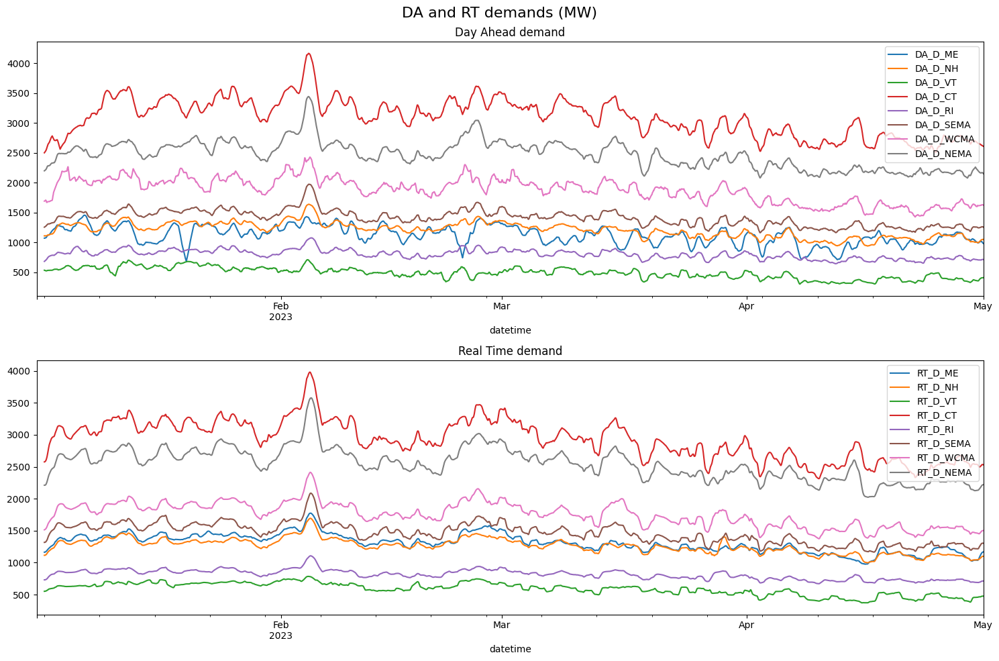

In [332]:
# Create a figure with two vertically stacked subplots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(8, 10))

# Plot data from df1 on the first subplot (top)

plot_demand.rolling(24).mean().plot(ax=ax1, figsize=(15,10),title="Day Ahead demand")

ax1.legend(loc='upper right')  # Legend for the first subplot

# Plot data from df2 on the second subplot (bottom)
plot_demand_RT.rolling(24).mean().plot(ax=ax2, figsize=(15,10),title="Real Time demand")
ax2.legend(loc='upper right')  # Legend for the second subplot

# Add an overall title to the set of subplots
fig.suptitle("DA and RT demands (MW)", fontsize=16)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [333]:
plot_LMPs_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_LMP')]]
plot_LMPs_DA.index=df["datetime"]

In [334]:
plot_EC_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_EC')]]
plot_EC_DA.index=df["datetime"]

In [335]:
plot_CC_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_CC')]]
plot_CC_DA.index=df["datetime"]

In [336]:
plot_MLC_DA=combined_df[[col for col in combined_df.columns if col.startswith('DA_MLC')]]
plot_MLC_DA.index=df["datetime"]

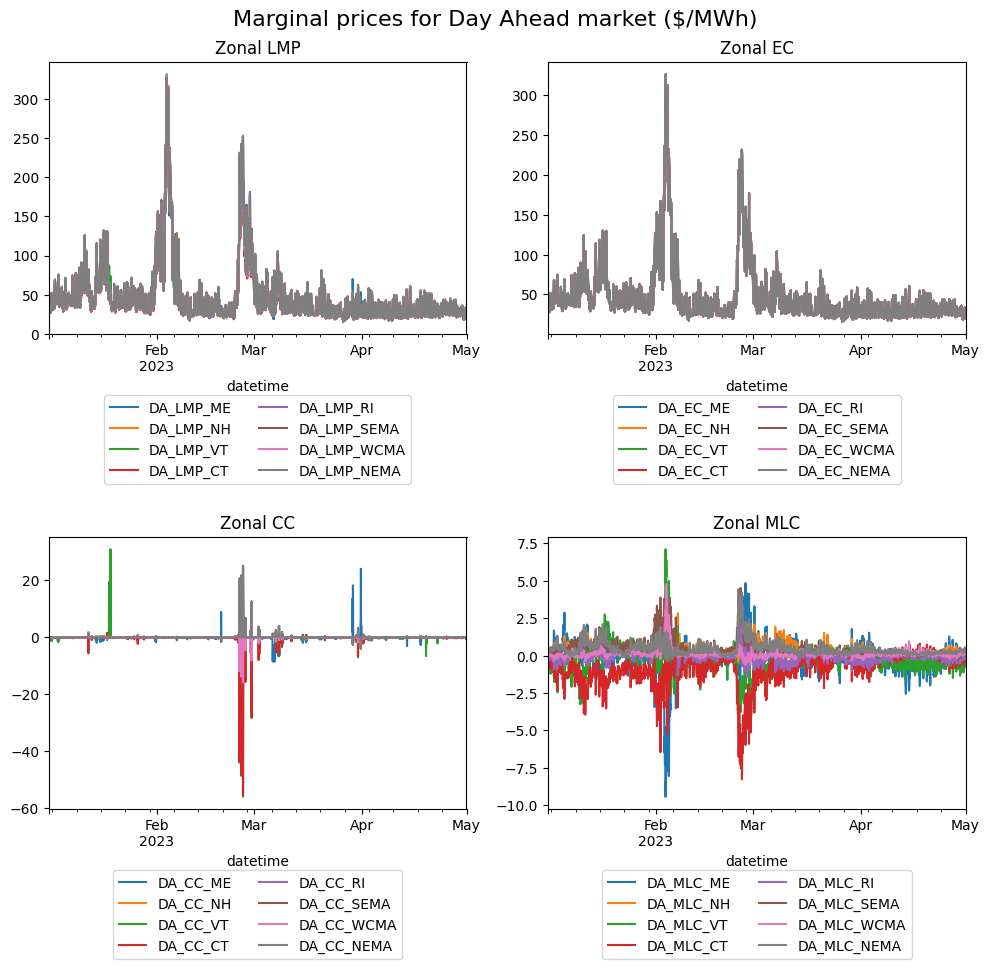

In [337]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
ma=1
# Plot data from df1 on the first subplot (top-left)
plot_LMPs_DA.rolling(ma).mean().plot(ax=axes[0, 0], title="Zonal LMP")
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df2 on the second subplot (top-right)
plot_EC_DA.rolling(ma).mean().plot(ax=axes[0, 1], title="Zonal EC")
axes[0, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df3 on the third subplot (bottom-left)
plot_CC_DA.rolling(ma).mean().plot(ax=axes[1, 0], title="Zonal CC")
axes[1, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df4 on the fourth subplot (bottom-right)
plot_MLC_DA.rolling(ma).mean().plot(ax=axes[1, 1], title="Zonal MLC")
axes[1, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
plt.suptitle("Marginal prices for Day Ahead market ($/MWh)", fontsize=16)
# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [338]:
px.line(plot_LMPs_DA)

In [339]:
plot_LMPs_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_LMP')]]
plot_LMPs_RT.index=df["datetime"]
plot_EC_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_EC')]]
plot_EC_RT.index=df["datetime"]
plot_CC_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_CC')]]
plot_CC_RT.index=df["datetime"]
plot_MLC_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_MLC')]]
plot_MLC_RT.index=df["datetime"]

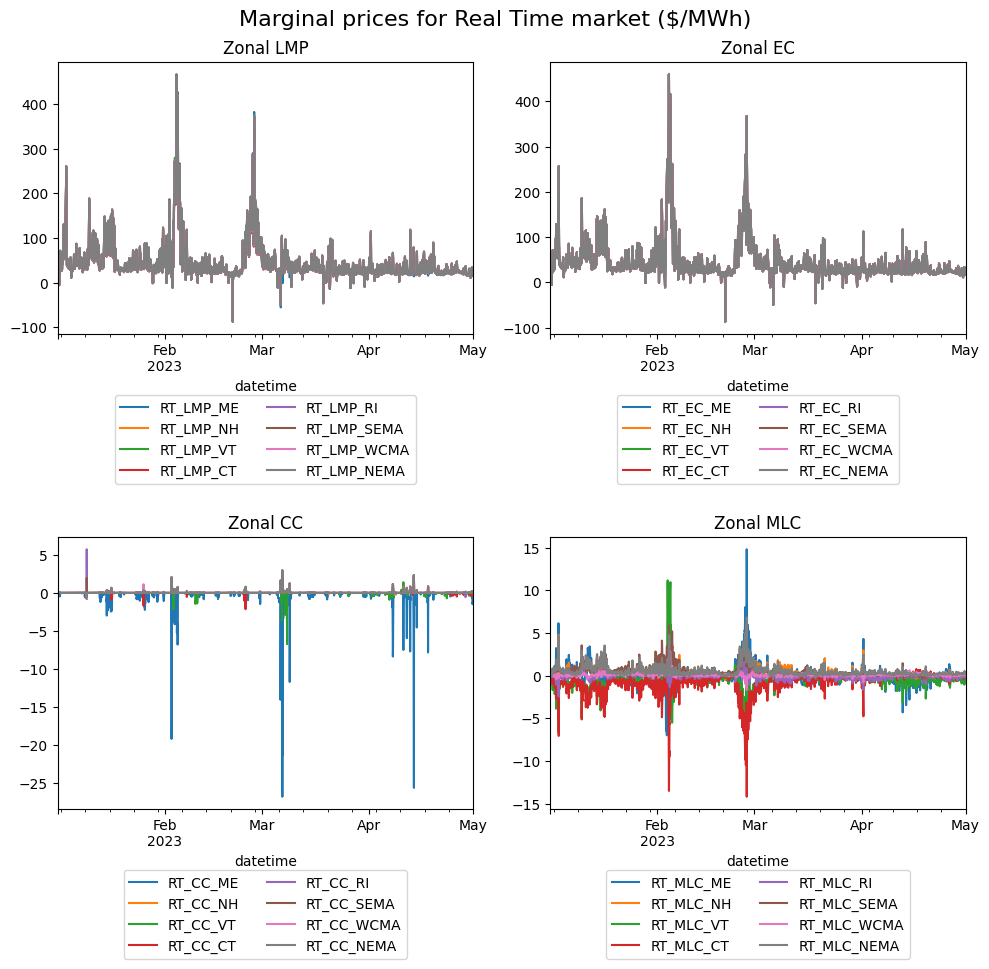

In [340]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
ma=1
# Plot data from df1 on the first subplot (top-left)
plot_LMPs_RT.rolling(ma).mean().plot(ax=axes[0, 0], title="Zonal LMP")
axes[0, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df2 on the second subplot (top-right)
plot_EC_RT.rolling(ma).mean().plot(ax=axes[0, 1], title="Zonal EC")
axes[0, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df3 on the third subplot (bottom-left)
plot_CC_RT.rolling(ma).mean().plot(ax=axes[1, 0], title="Zonal CC")
axes[1, 0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
# Plot data from df4 on the fourth subplot (bottom-right)
plot_MLC_RT.rolling(ma).mean().plot(ax=axes[1, 1], title="Zonal MLC")
axes[1, 1].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=2)
plt.suptitle("Marginal prices for Real Time market ($/MWh)", fontsize=16)
# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [341]:
combined_df['datetime']=df['datetime']

### ==================================================================================

In [342]:
scaler = StandardScaler()
dalmp=combined_df[[col for col in combined_df.columns if col.startswith('DA_LMP')]]
dalmp_standardized = scaler.fit_transform(dalmp)
pca = PCA(n_components=2)
pca.fit(dalmp_standardized)
print(pca.explained_variance_ratio_*100)

[99.80530999  0.16478396]


In [343]:
reduced_data=pd.DataFrame(pca.fit_transform(dalmp_standardized, y=None))
reduced_data["datetime"]=df["datetime"]
reduced_data["hr"]=np.array(df["Hr_End"])

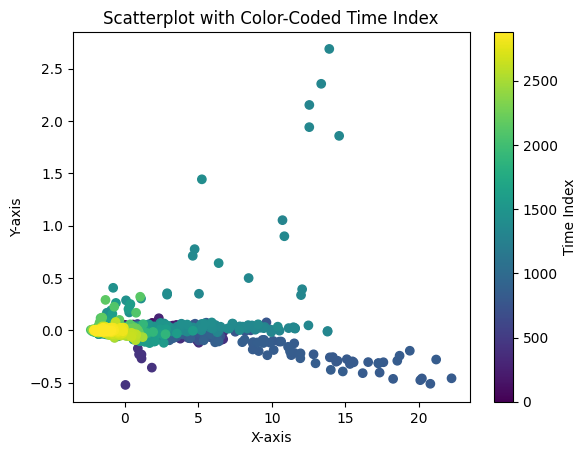

In [344]:
# Create a colormap for coloring the points based on time index
colormap = plt.cm.viridis  # You can choose a different colormap
plt.scatter(reduced_data[0],reduced_data[1], c=range(len(df)), cmap=colormap)
plt.colorbar(label='Time Index')

# Set axis labels and plot title
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Scatterplot with Color-Coded Time Index')

# Show the plot
plt.show()

In [345]:
fig = px.scatter(reduced_data, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 marginal_x="histogram", marginal_y="rug",
                 width=800, height=600)
fig.show()

## Check the temperatures

In [346]:
drybulb=combined_df[[col for col in combined_df.columns if col.startswith('Dry_Bulb')]]

In [347]:
drybulb.index=df["datetime"]
print(drybulb.index)

DatetimeIndex(['2023-01-01 01:00:00', '2023-01-01 02:00:00',
               '2023-01-01 03:00:00', '2023-01-01 04:00:00',
               '2023-01-01 05:00:00', '2023-01-01 06:00:00',
               '2023-01-01 07:00:00', '2023-01-01 08:00:00',
               '2023-01-01 09:00:00', '2023-01-01 10:00:00',
               ...
               '2023-04-30 15:00:00', '2023-04-30 16:00:00',
               '2023-04-30 17:00:00', '2023-04-30 18:00:00',
               '2023-04-30 19:00:00', '2023-04-30 20:00:00',
               '2023-04-30 21:00:00', '2023-04-30 22:00:00',
               '2023-04-30 23:00:00', '2023-05-01 00:00:00'],
              dtype='datetime64[ns]', name='datetime', length=2880, freq=None)


In [348]:
ptdrybulb=pd.DataFrame(columns=drybulb.columns.to_list())   # add 50 to graph temperatures on different levels
print(ptdrybulb)
for i in range(8):
    ptdrybulb.iloc[:, i]=drybulb.iloc[:, i] + i * 50
print(ptdrybulb)

Empty DataFrame
Columns: [Dry_Bulb_ME, Dry_Bulb_NH, Dry_Bulb_VT, Dry_Bulb_CT, Dry_Bulb_RI, Dry_Bulb_SEMA, Dry_Bulb_WCMA, Dry_Bulb_NEMA]
Index: []
                     Dry_Bulb_ME  Dry_Bulb_NH  Dry_Bulb_VT  Dry_Bulb_CT  \
datetime                                                                  
2023-01-01 01:00:00           44           95          151          200   
2023-01-01 02:00:00           45           93          151          200   
2023-01-01 03:00:00           44           92          150          200   
2023-01-01 04:00:00           47           92          149          198   
2023-01-01 05:00:00           46           92          149          198   
...                          ...          ...          ...          ...   
2023-04-30 20:00:00           46           97          155          202   
2023-04-30 21:00:00           47           97          155          201   
2023-04-30 22:00:00           48           98          154          201   
2023-04-30 23:00:00          

<ipython-input-348-6a0f9e7a7a4e>:4: DeprecationWarning:

In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`



In [349]:
px.line(ptdrybulb)

In [350]:
scaler = StandardScaler()
print(drybulb)
drybulb_standardized = scaler.fit_transform(drybulb)
print(drybulb_standardized)

pca = PCA(n_components=3)
pca.fit(drybulb_standardized)
print(pca.explained_variance_ratio_*100)

                     Dry_Bulb_ME  Dry_Bulb_NH  Dry_Bulb_VT  Dry_Bulb_CT  \
datetime                                                                  
2023-01-01 01:00:00           44           45           51           50   
2023-01-01 02:00:00           45           43           51           50   
2023-01-01 03:00:00           44           42           50           50   
2023-01-01 04:00:00           47           42           49           48   
2023-01-01 05:00:00           46           42           49           48   
...                          ...          ...          ...          ...   
2023-04-30 20:00:00           46           47           55           52   
2023-04-30 21:00:00           47           47           55           51   
2023-04-30 22:00:00           48           48           54           51   
2023-04-30 23:00:00           48           49           54           52   
2023-05-01 00:00:00           49           50           53           52   

                     Dry

In [351]:
reduced_db=pd.DataFrame(pca.fit_transform(drybulb_standardized, y=None))

reduced_db["datetime"]=df["datetime"]

reduced_db["hr"]=np.array(df["Hr_End"])
print(reduced_db)

             0         1         2            datetime  hr
0    -2.372647 -0.372069 -0.089551 2023-01-01 01:00:00   1
1    -2.544613 -0.185779  0.018805 2023-01-01 02:00:00   2
2    -2.591943 -0.020351  0.195876 2023-01-01 03:00:00   3
3    -2.574258  0.077769 -0.098739 2023-01-01 04:00:00   4
4    -2.576514  0.099353 -0.036020 2023-01-01 05:00:00   5
...        ...       ...       ...                 ...  ..
2875 -3.018514 -0.212148  0.111360 2023-04-30 20:00:00  20
2876 -3.186550 -0.063603  0.091698 2023-04-30 21:00:00  21
2877 -3.222303 -0.025819 -0.036235 2023-04-30 22:00:00  22
2878 -3.410864  0.039826  0.025069 2023-04-30 23:00:00  23
2879 -3.505428  0.069831  0.002084 2023-05-01 00:00:00  24

[2880 rows x 5 columns]


In [352]:
fig = px.scatter(reduced_db, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 width=800, height=600)
fig.show()    # if we look at PC1 and PC2 axis we can notice that the data is centered and changes marginally accross the different times

## Since the total LMP are highly correlated, check correlation in the day ahead congestion and the loss components

In [353]:
## Congestion cost
da_cc=combined_df[[col for col in combined_df.columns if col.startswith('DA_CC')]]
da_cc
scaler = StandardScaler()
da_cc_standardized = scaler.fit_transform(da_cc)
pca = PCA(n_components=3)
pca.fit(da_cc_standardized)
print(pca.explained_variance_ratio_*100)
da_reduced_cc=pd.DataFrame(pca.fit_transform(da_cc_standardized, y=None))
da_reduced_cc["datetime"]=df["datetime"]
da_reduced_cc["hr"]=np.array(df["Hr_End"])

[89.2786314   8.80707812  1.5033348 ]


In [354]:
fig = px.scatter(da_reduced_cc, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 width=800, height=600)
fig.show()

In [355]:
## cost of loss
da_mlc=combined_df[[col for col in combined_df.columns if col.startswith('DA_MLC')]]
da_mlc
scaler = StandardScaler()
da_mlc_standardized = scaler.fit_transform(da_mlc)
pca = PCA(n_components=5)
pca.fit(da_mlc_standardized)
print(pca.explained_variance_ratio_*100)
da_reduced_mlc=pd.DataFrame(pca.fit_transform(da_mlc_standardized, y=None))
da_reduced_mlc["datetime"]=df["datetime"]
da_reduced_mlc["hr"]=np.array(df["Hr_End"])


[39.47924033 37.52276668 13.79248622  4.45557822  2.00000178]


In [356]:
fig = px.scatter(da_reduced_mlc, x=0, y=1, color="hr", hover_data=['hr','datetime'],
                 width=800, height=600)
fig.show()

## Check correlation of da demand

In [357]:
## cost of loss
## reduced from 8 to 4 components . The data has high variation.
scaler = StandardScaler()
da_demand_standardized = scaler.fit_transform(plot_demand)
pca = PCA(n_components=8)
pca.fit(da_demand_standardized )
print(pca.explained_variance_ratio_*100)
da_reduced_demand=pd.DataFrame(pca.fit_transform(da_demand_standardized , y=None))
da_reduced_demand["datetime"]=df["datetime"]
da_reduced_demand["hr"]=np.array(df["Hr_End"])

[74.21369064  9.83331954  6.76731706  5.34022007  1.60217033  1.01240495
  0.73004506  0.50083234]


In [358]:
combined_df

,DA_D_ME,RT_D_ME,DA_LMP_ME,DA_EC_ME,DA_CC_ME,DA_MLC_ME,RT_LMP_ME,RT_EC_ME,RT_CC_ME,RT_MLC_ME,...,DA_EC_NEMA,DA_CC_NEMA,DA_MLC_NEMA,RT_LMP_NEMA,RT_EC_NEMA,RT_CC_NEMA,RT_MLC_NEMA,Dry_Bulb_NEMA,Dew_Point_NEMA,datetime
0,923.3,1038.795,31.45,31.28,0.00,0.17,37.04,36.93,0.00,0.11,...,31.28,0.00,0.33,37.36,36.93,0.00,0.43,54,54,2023-01-01 01:00:00
1,893.3,986.243,28.54,28.44,0.00,0.10,33.49,33.39,0.00,0.10,...,28.44,0.00,0.26,33.77,33.39,0.00,0.38,54,53,2023-01-01 02:00:00
2,875.3,963.011,26.91,26.83,0.00,0.08,32.05,32.09,0.00,-0.04,...,26.83,0.00,0.23,32.42,32.09,0.00,0.33,54,53,2023-01-01 03:00:00
3,877.6,954.115,28.26,28.19,0.00,0.07,31.70,31.75,0.01,-0.06,...,28.19,0.00,0.23,32.10,31.75,0.01,0.34,54,52,2023-01-01 04:00:00
4,903.5,957.370,29.83,29.70,0.00,0.13,31.77,31.80,0.00,-0.03,...,29.70,0.00,0.25,32.15,31.80,0.00,0.35,55,52,2023-01-01 05:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,1034.9,1359.192,32.48,33.57,-0.35,-0.74,27.99,30.21,-1.48,-0.74,...,33.57,0.06,0.54,30.87,30.21,0.20,0.46,51,51,2023-04-30 20:00:00
2876,978.6,1296.247,28.82,30.27,-0.71,-0.74,20.65,22.63,-1.34,-0.64,...,30.27,0.12,0.45,23.11,22.63,0.16,0.32,52,51,2023-04-30 21:00:00
2877,876.5,1202.111,24.71,25.53,-0.36,-0.46,15.60,17.29,-1.19,-0.50,...,25.53,0.08,0.37,17.68,17.29,0.16,0.23,53,52,2023-04-30 22:00:00
2878,807.6,1098.059,23.14,23.94,-0.33,-0.47,19.35,21.11,-1.26,-0.50,...,23.94,0.06,0.33,21.61,21.11,0.22,0.28,54,53,2023-04-30 23:00:00


In [359]:
plot_demand=combined_df[[col for col in combined_df.columns if col.startswith('DA_D')]]
plot_demand.index=df["datetime"]
plot_demand

,DA_D_ME,DA_D_NH,DA_D_VT,DA_D_CT,DA_D_RI,DA_D_SEMA,DA_D_WCMA,DA_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,923.3,948.0,478.7,2237.6,624.5,1085.5,1398.1,1949.2
2023-01-01 02:00:00,893.3,903.0,451.1,2133.8,586.6,1020.6,1342.8,1866.1
2023-01-01 03:00:00,875.3,895.5,454.7,2080.5,580.5,1002.9,1578.9,1829.7
2023-01-01 04:00:00,877.6,887.3,457.2,2051.7,582.5,997.8,1577.0,1816.6
2023-01-01 05:00:00,903.5,891.0,455.5,2058.2,588.6,999.4,1899.1,1829.9
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1034.9,1167.5,501.6,3001.9,862.5,1469.6,1752.0,2527.5
2023-04-30 21:00:00,978.6,1136.9,496.2,2892.2,827.8,1451.6,1731.6,2455.5
2023-04-30 22:00:00,876.5,1067.6,488.2,2758.8,811.4,1403.2,1638.1,2408.9


## Check for stationarity

In [360]:
from statsmodels.tsa.stattools import adfuller

In [361]:
plot_demand

,DA_D_ME,DA_D_NH,DA_D_VT,DA_D_CT,DA_D_RI,DA_D_SEMA,DA_D_WCMA,DA_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,923.3,948.0,478.7,2237.6,624.5,1085.5,1398.1,1949.2
2023-01-01 02:00:00,893.3,903.0,451.1,2133.8,586.6,1020.6,1342.8,1866.1
2023-01-01 03:00:00,875.3,895.5,454.7,2080.5,580.5,1002.9,1578.9,1829.7
2023-01-01 04:00:00,877.6,887.3,457.2,2051.7,582.5,997.8,1577.0,1816.6
2023-01-01 05:00:00,903.5,891.0,455.5,2058.2,588.6,999.4,1899.1,1829.9
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1034.9,1167.5,501.6,3001.9,862.5,1469.6,1752.0,2527.5
2023-04-30 21:00:00,978.6,1136.9,496.2,2892.2,827.8,1451.6,1731.6,2455.5
2023-04-30 22:00:00,876.5,1067.6,488.2,2758.8,811.4,1403.2,1638.1,2408.9


In [362]:
# Define a function to check stationarity using ADF test
def check_stationarity(column_data):
    result = adfuller(column_data)
    p_value = result[1]
    if p_value <= 0.05:
        return "Stationary (p-value: {:.4f})".format(p_value)
    else:
        return "Non-Stationary (p-value: {:.4f})".format(p_value)

In [363]:
# Check stationarity for each column in the DataFrame
for column in plot_demand.columns:
    stationarity_result = check_stationarity(plot_demand[column])
    print(f"{column}: {stationarity_result}")

DA_D_ME: Stationary (p-value: 0.0000)
DA_D_NH: Stationary (p-value: 0.0031)
DA_D_VT: Stationary (p-value: 0.0006)
DA_D_CT: Stationary (p-value: 0.0024)
DA_D_RI: Stationary (p-value: 0.0000)
DA_D_SEMA: Stationary (p-value: 0.0008)
DA_D_WCMA: Stationary (p-value: 0.0029)
DA_D_NEMA: Stationary (p-value: 0.0012)


In [364]:
# Check stationarity for each column in the DataFrame
for column in plot_LMPs_DA.columns:
    stationarity_result = check_stationarity(plot_LMPs_DA[column])
    print(f"{column}: {stationarity_result}")

DA_LMP_ME: Stationary (p-value: 0.0000)
DA_LMP_NH: Stationary (p-value: 0.0000)
DA_LMP_VT: Stationary (p-value: 0.0000)
DA_LMP_CT: Stationary (p-value: 0.0000)
DA_LMP_RI: Stationary (p-value: 0.0000)
DA_LMP_SEMA: Stationary (p-value: 0.0000)
DA_LMP_WCMA: Stationary (p-value: 0.0000)
DA_LMP_NEMA: Stationary (p-value: 0.0000)


In [365]:
adfuller(plot_LMPs_DA["DA_LMP_ME"].values)

(-5.210684211096779,
 8.36107439222217e-06,
 25,
 2854,
 {'1%': -3.432643339636199,
  '5%': -2.8625532405212315,
  '10%': -2.5673093777970064},
 20445.170914240676)

In [366]:
# Check stationarity for each column in the DataFrame
for column in drybulb.columns:
    stationarity_result = check_stationarity(drybulb[column])
    print(f"{column}: {stationarity_result}")

Dry_Bulb_ME: Stationary (p-value: 0.0001)
Dry_Bulb_NH: Stationary (p-value: 0.0002)
Dry_Bulb_VT: Stationary (p-value: 0.0000)
Dry_Bulb_CT: Stationary (p-value: 0.0000)
Dry_Bulb_RI: Stationary (p-value: 0.0000)
Dry_Bulb_SEMA: Stationary (p-value: 0.0000)
Dry_Bulb_WCMA: Stationary (p-value: 0.0000)
Dry_Bulb_NEMA: Stationary (p-value: 0.0000)


## Granger tests for dependence of LMPs on the demands in zones

In [367]:
drybulb["Dry_Bulb_ME"]

datetime
2023-01-01 01:00:00    44
2023-01-01 02:00:00    45
2023-01-01 03:00:00    44
2023-01-01 04:00:00    47
2023-01-01 05:00:00    46
                       ..
2023-04-30 20:00:00    46
2023-04-30 21:00:00    47
2023-04-30 22:00:00    48
2023-04-30 23:00:00    48
2023-05-01 00:00:00    49
Name: Dry_Bulb_ME, Length: 2880, dtype: int64

## Find the ARIMA structure

In [368]:
!pip install pmdarima
import pmdarima as pm
from statsmodels.tsa.stattools import kpss
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from pmdarima import model_selection
from sklearn.metrics import mean_squared_error


plot_demand_RT=combined_df[[col for col in combined_df.columns if col.startswith('RT_D')]]
plot_demand_RT.index=df["datetime"]
plot_demand_RT

,RT_D_ME,RT_D_NH,RT_D_VT,RT_D_CT,RT_D_RI,RT_D_SEMA,RT_D_WCMA,RT_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,1038.795,977.609,501.150,2402.505,679.807,1215.458,1370.626,2091.333
2023-01-01 02:00:00,986.243,932.173,477.935,2296.201,649.560,1156.525,1322.192,2015.087
2023-01-01 03:00:00,963.011,901.001,459.938,2206.229,625.247,1113.456,1278.846,1946.864
2023-01-01 04:00:00,954.115,888.381,449.098,2165.210,610.632,1084.984,1252.440,1906.152
2023-01-01 05:00:00,957.370,888.618,448.869,2153.453,621.239,1071.605,1253.525,1889.672
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1359.192,1278.941,593.521,3007.563,837.938,1527.535,1754.703,2538.738
2023-04-30 21:00:00,1296.247,1228.907,574.398,2913.519,813.062,1481.448,1712.036,2487.814
2023-04-30 22:00:00,1202.111,1139.513,543.648,2738.188,761.778,1377.832,1612.734,2383.047


In [369]:
plot_demand_RT

,RT_D_ME,RT_D_NH,RT_D_VT,RT_D_CT,RT_D_RI,RT_D_SEMA,RT_D_WCMA,RT_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,1038.795,977.609,501.150,2402.505,679.807,1215.458,1370.626,2091.333
2023-01-01 02:00:00,986.243,932.173,477.935,2296.201,649.560,1156.525,1322.192,2015.087
2023-01-01 03:00:00,963.011,901.001,459.938,2206.229,625.247,1113.456,1278.846,1946.864
2023-01-01 04:00:00,954.115,888.381,449.098,2165.210,610.632,1084.984,1252.440,1906.152
2023-01-01 05:00:00,957.370,888.618,448.869,2153.453,621.239,1071.605,1253.525,1889.672
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1359.192,1278.941,593.521,3007.563,837.938,1527.535,1754.703,2538.738
2023-04-30 21:00:00,1296.247,1228.907,574.398,2913.519,813.062,1481.448,1712.036,2487.814
2023-04-30 22:00:00,1202.111,1139.513,543.648,2738.188,761.778,1377.832,1612.734,2383.047


FIND ARIMA STRUCTURE FOR DA_D_ME DEMAND

1. Check Stationarity of the DA_D_ME

4 Month

In [370]:
  fig = px.line(plot_demand_RT["RT_D_ME"], x=plot_demand_RT.index, y="RT_D_ME")
  fig.show()

1 month


In [371]:
first_month_data = plot_demand_RT.index[0:720]
fig = px.line(plot_demand_RT["RT_D_ME"].iloc[:720], x=first_month_data, y="RT_D_ME")
fig.show()

1 week

In [372]:
first_month_data = plot_demand_RT.index[0:180]
fig = px.line(plot_demand_RT["RT_D_ME"].iloc[:180], x=first_month_data, y="RT_D_ME")
fig.show()

In [373]:
# Check stationarity of RT_D_ME in the DataFrame
def check_stationarity_ADF(column_data):
    result = adfuller(column_data)
    p_value = result[1]
    return result
    #if p_value <= 0.05:
     #  return "Stationary (p-value: {:.4f})".format(p_value)
    #else:
       # return "Non-Stationary (p-value: {:.4f})".format(p_value)
stationarity_result_ADF = check_stationarity_ADF(plot_demand_RT["RT_D_ME"])
stationarity_result_KPSS = kpss(plot_demand_RT["RT_D_ME"], regression = "ct")

print(f"'RT_D_ME': 'ADF Statistic:', {stationarity_result_ADF[0]}, 'p-value:', {stationarity_result_ADF[1]},'Critical Values:', {stationarity_result_ADF[4]}")
print(f"'RT_D_ME': 'KPSS Statistic:', {stationarity_result_KPSS[0]}, 'p-value:', {stationarity_result_KPSS[1]},'Critical Values:', {stationarity_result_KPSS[3]}")

'RT_D_ME': 'ADF Statistic:', -3.1031397772544573, 'p-value:', 0.02632170178672962,'Critical Values:', {'1%': -3.43264575500919, '5%': -2.862554307267278, '10%': -2.567309945727228}
'RT_D_ME': 'KPSS Statistic:', 0.5821153314450231, 'p-value:', 0.01,'Critical Values:', {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}


<ipython-input-373-9ec750943442>:11: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




ADF - stationary , p-value is less than 0.05 and ADF statistic smaller thant critical values
KPSS - non-stationary, p_value is less thant 0.05

> Indented block



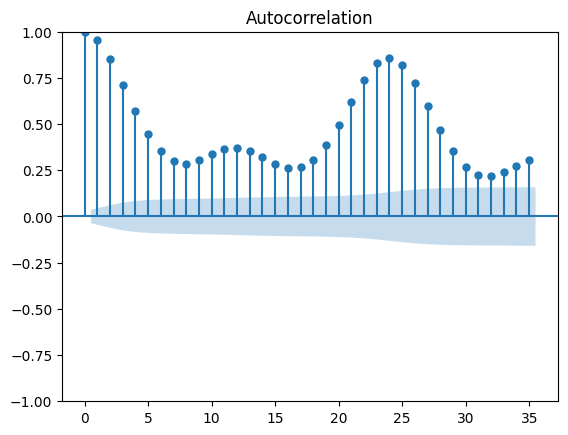

In [374]:
plot_acf(plot_demand_RT["RT_D_ME"])
plt.show()

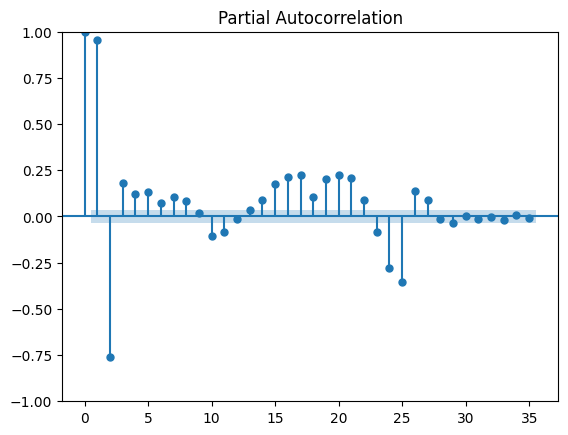

In [375]:
plot_pacf(plot_demand_RT["RT_D_ME"])
plt.show()

In [376]:
plot_demand_RT

,RT_D_ME,RT_D_NH,RT_D_VT,RT_D_CT,RT_D_RI,RT_D_SEMA,RT_D_WCMA,RT_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,1038.795,977.609,501.150,2402.505,679.807,1215.458,1370.626,2091.333
2023-01-01 02:00:00,986.243,932.173,477.935,2296.201,649.560,1156.525,1322.192,2015.087
2023-01-01 03:00:00,963.011,901.001,459.938,2206.229,625.247,1113.456,1278.846,1946.864
2023-01-01 04:00:00,954.115,888.381,449.098,2165.210,610.632,1084.984,1252.440,1906.152
2023-01-01 05:00:00,957.370,888.618,448.869,2153.453,621.239,1071.605,1253.525,1889.672
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1359.192,1278.941,593.521,3007.563,837.938,1527.535,1754.703,2538.738
2023-04-30 21:00:00,1296.247,1228.907,574.398,2913.519,813.062,1481.448,1712.036,2487.814
2023-04-30 22:00:00,1202.111,1139.513,543.648,2738.188,761.778,1377.832,1612.734,2383.047


AR PROCESS WITH LAG 2 BASED ON the  CUT OFF in PACF and decay in ACF? LETS CHECK FOR SEASONALITY COMPONENT



If we assume an additive decomposition, then we can write
y
t
=
S
t
+
T
t
+
R
t
,

where  
y
t
  is the data,  
S
t
  is the seasonal component,  
T
t
  is the trend-cycle component, and  
R
t
  is the remainder component, all at period t

  The additive decomposition is the most appropriate if the magnitude of the seasonal fluctuations, or the variation around the trend-cycle, does not vary with the level of the time series.

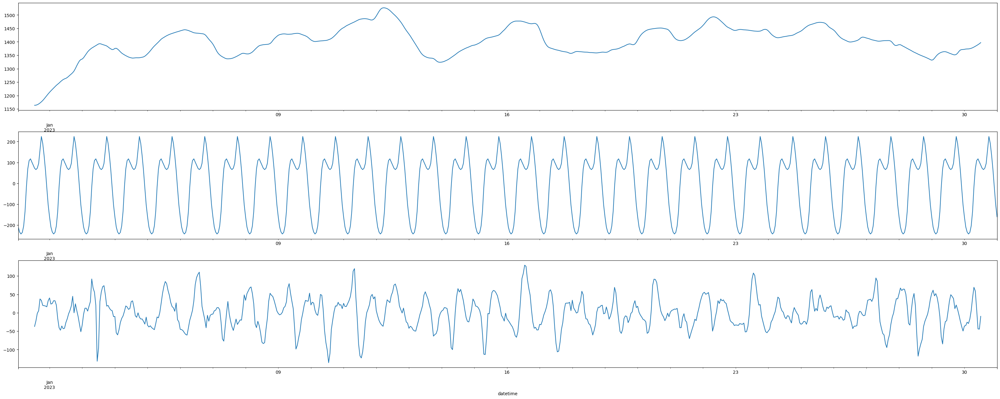

In [377]:
seasonal_ME1=seasonal_decompose(plot_demand_RT["RT_D_ME"].iloc[:720], model='additive')
seasonal_ME=seasonal_decompose(plot_demand_RT["RT_D_ME"], model='additive')
#fig, axes = plt.subplots(figsize=(40, 15))

#fig=seasonal_ME.plot(axes)

# Create a figure and set the size
fig = plt.figure(figsize=(40, 15))

# Generate and display the decomposition plot
ax1 = fig.add_subplot(311)
ax2 = fig.add_subplot(312)
ax3 = fig.add_subplot(313)
seasonal_ME1.trend.plot(ax=ax1)
seasonal_ME1.seasonal.plot(ax=ax2)
seasonal_ME1.resid.plot(ax=ax3)



# Gathering and plotting the trend, seasonality, and residuals
trend = seasonal_ME.trend
seasonal = seasonal_ME.seasonal
residual = seasonal_ME.resid

In [378]:
from statsmodels.tsa.stattools import adfuller
import numpy as np
def check_stationarity(ts):
    dftest = adfuller(ts)
    adf = dftest[0]
    pvalue = dftest[1]
    critical_value = dftest[4]['5%']
    if (pvalue < 0.05) and (adf < critical_value):
        print('The series is stationary')
    else:
        print('The series is NOT stationary')

Check TIME SERIES STATIONARITY

In [379]:
check_stationarity(plot_demand_RT["RT_D_ME"])

The series is stationary


Check TREND using ADF and KPSS


ADF

In [380]:
clean_trend=trend.dropna()
check_stationarity(clean_trend)

The series is NOT stationary


KPSS

Check Seasonal STATIONARITY using ADF and KPSS

In [381]:
check_stationarity(seasonal_ME.seasonal)  #ADF

The series is stationary


In [382]:
seasonal_KPSS = kpss(seasonal)

<ipython-input-382-fca966380ff3>:1: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




REMOVE SEASONAL COMPONENT FROM DATA

(2856,)

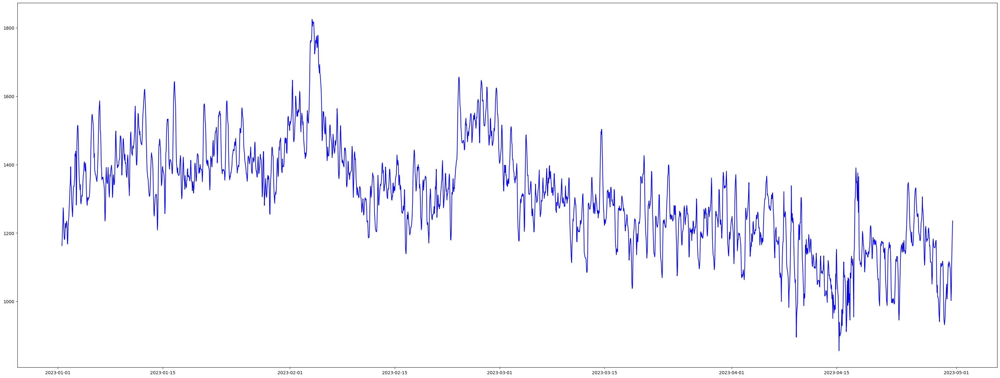

In [383]:
nonseasonal_ME=trend+residual
plt.figure(figsize=(40, 15))

plt.plot(trend.index,nonseasonal_ME, c='b')
fig.show()
trend.dropna().shape

In [384]:
plot_demand_RT

,RT_D_ME,RT_D_NH,RT_D_VT,RT_D_CT,RT_D_RI,RT_D_SEMA,RT_D_WCMA,RT_D_NEMA
datetime,,,,,,,,
2023-01-01 01:00:00,1038.795,977.609,501.150,2402.505,679.807,1215.458,1370.626,2091.333
2023-01-01 02:00:00,986.243,932.173,477.935,2296.201,649.560,1156.525,1322.192,2015.087
2023-01-01 03:00:00,963.011,901.001,459.938,2206.229,625.247,1113.456,1278.846,1946.864
2023-01-01 04:00:00,954.115,888.381,449.098,2165.210,610.632,1084.984,1252.440,1906.152
2023-01-01 05:00:00,957.370,888.618,448.869,2153.453,621.239,1071.605,1253.525,1889.672
...,...,...,...,...,...,...,...,...
2023-04-30 20:00:00,1359.192,1278.941,593.521,3007.563,837.938,1527.535,1754.703,2538.738
2023-04-30 21:00:00,1296.247,1228.907,574.398,2913.519,813.062,1481.448,1712.036,2487.814
2023-04-30 22:00:00,1202.111,1139.513,543.648,2738.188,761.778,1377.832,1612.734,2383.047


PACF AR(P)=2

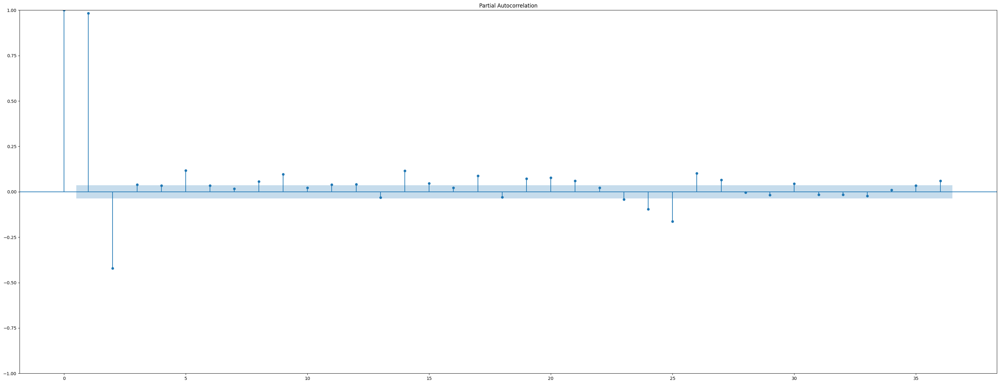

In [385]:
# Create your PACF plot
fig, ax = plt.subplots(figsize=(40, 15))
plot_pacf(nonseasonal_ME.dropna(), lags=36, ax=ax)

# Show the PACF plot
plt.show()

ACF PLOT  MA(q)

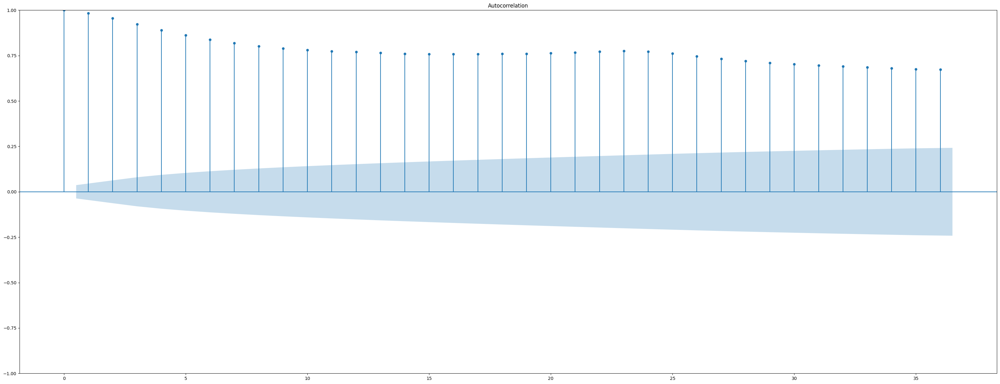

In [386]:
# Create your PACF plot
fig, ax = plt.subplots(figsize=(40, 15))
plot_acf(nonseasonal_ME.dropna(), lags=36, ax=ax)

# Show the PACF plot
plt.show()

Differencing need to be applied since ACF has slowly decreasing trend

KPSS AND ADF TEST OF NONSEASONAL COMPONENT

KPSS TELLS THAT WE NEED TO DIFFERENCE AT LEAST ONCE

In [387]:
from pmdarima.arima.utils import ndiffs
from pmdarima.arima.stationarity import ADFTest

stationarity_result_ADF = check_stationarity_ADF(plot_demand_RT["RT_D_ME"])
stationarity_result_KPSS = kpss(plot_demand_RT["RT_D_ME"], regression = "ct")

print(f"'RT_D_ME': 'ADF Statistic:', {stationarity_result_ADF[0]}, 'p-value:', {stationarity_result_ADF[1]},'Critical Values:', {stationarity_result_ADF[4]}")
print(f"'RT_D_ME': 'KPSS Statistic:', {stationarity_result_KPSS[0]}, 'p-value:', {stationarity_result_KPSS[1]},'Critical Values:', {stationarity_result_KPSS[3]}")

# Test whether we should difference at the alpha=0.05
# significance level
adf_test = ADFTest(alpha=0.05)
p_val, should_diff = adf_test.should_diff(plot_demand_RT["RT_D_ME"])  # (0.01, False)
print('adf test',p_val, should_diff)

# Estimate the number of differences using an ADF test:
n_adf = ndiffs(plot_demand_RT["RT_D_ME"], test='adf')  # -> 0

# Or a KPSS test (auto_arima default):
n_kpss = ndiffs(plot_demand_RT["RT_D_ME"], test='kpss')  # -> 0

# Or a PP test:
n_pp = ndiffs(plot_demand_RT["RT_D_ME"], test='pp')  # -> 0
print('adf', n_adf )
print('kpss', n_kpss)
print('pp', n_pp)


'RT_D_ME': 'ADF Statistic:', -3.1031397772544573, 'p-value:', 0.02632170178672962,'Critical Values:', {'1%': -3.43264575500919, '5%': -2.862554307267278, '10%': -2.567309945727228}
'RT_D_ME': 'KPSS Statistic:', 0.5821153314450231, 'p-value:', 0.01,'Critical Values:', {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
adf test 0.01 False
adf 0
kpss 1
pp 0


<ipython-input-387-f60458dcd1b3>:5: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




DIFFERENCE NONSEASONAL COMPONENTS

ACF TELLS MA(q)=10

adf 0
kpss 0
pp 0


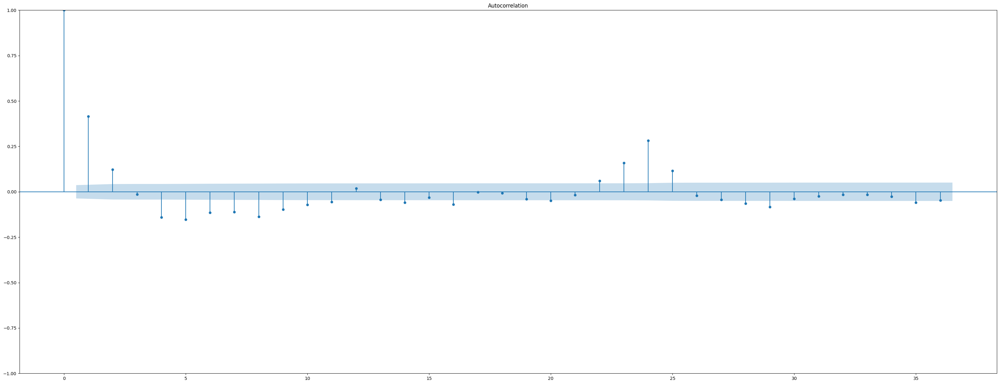

In [388]:
from pmdarima.utils import c, diff
plot_demand_RTdiff = pd.DataFrame()
plot_demand_RTdiff['First Difference']=diff(nonseasonal_ME.dropna() , lag=1, differences=1)

# Estimate the number of differences using an ADF test:
n_adf_1 = ndiffs(plot_demand_RTdiff['First Difference'], test='adf')  # -> 0

# Or a KPSS test (auto_arima default):
n_kpss_1 = ndiffs(plot_demand_RTdiff['First Difference'], test='kpss')  # -> 0

# Or a PP test:
n_pp_1 = ndiffs(plot_demand_RTdiff['First Difference'], test='pp')  # -> 0
print('adf', n_adf_1  )
print('kpss', n_kpss_1)
print('pp', n_pp_1)


# Create your ACF plot
fig, ax = plt.subplots(figsize=(40, 15))
plot_acf(plot_demand_RTdiff['First Difference'], lags=36, ax=ax)
plt.show()

ACF TELLS AR(P)=9

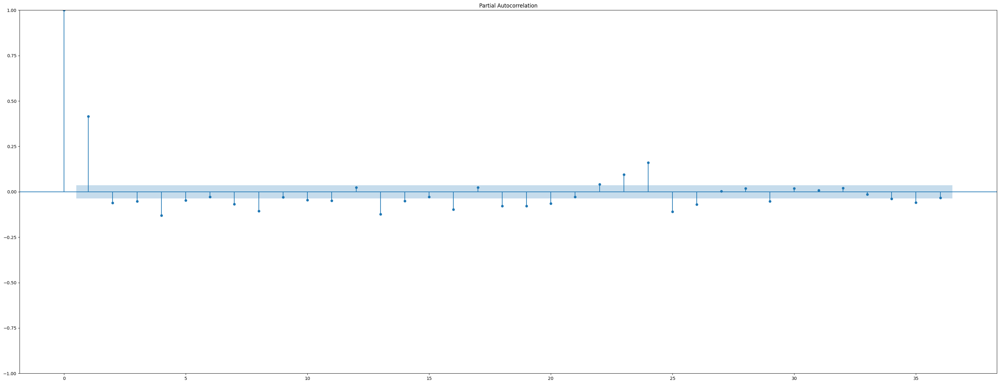

In [389]:
# Create your PACF plot
fig, ax = plt.subplots(figsize=(40, 15))
plot_pacf(plot_demand_RTdiff['First Difference'], lags=36, ax=ax)
plt.show()

The data may follow an ARIMA(
p
 ,
d
 ,0) model if the ACF and PACF plots of the differenced data show the following patterns:

the ACF is exponentially decaying or sinusoidal;
there is a significant spike at lag p
  in the PACF, but none beyond lag  p.

AR(5,1,0)
AR(9,1,0)
AR(14,1,0)


SPLIT DATA INTO TRAINING AND TEST SET

(2284,) (572,)


<Figure size 640x480 with 0 Axes>

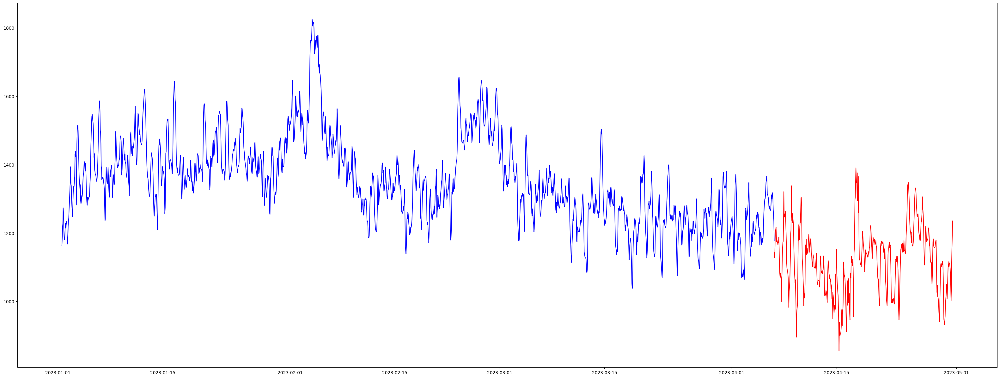

In [390]:
m=nonseasonal_ME.dropna()

train_size= int(len(m)*0.80)
train, test=m[:train_size],m[train_size:]
print(train.shape, test.shape)

plt.figure()
plt.figure(figsize=(40, 15))
plt.plot(train, c='b')
plt.plot(test,c='red')




In [391]:
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

model_RT1=ARIMA(train , order=(5, 1,0))
model_fit_RT1=model_RT1.fit()



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



In [392]:
print(model_fit_RT1.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2284
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -10137.949
Date:                Thu, 09 Nov 2023   AIC                          20287.898
Time:                        20:16:47   BIC                          20322.298
Sample:                    01-01-2023   HQIC                         20300.444
                         - 04-06-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6172      0.015     42.053      0.000       0.588       0.646
ar.L2         -0.1865      0.019     -9.807      0.000      -0.224      -0.149
ar.L3          0.0114      0.024      0.480      0.6

Test RMSE: 107.677


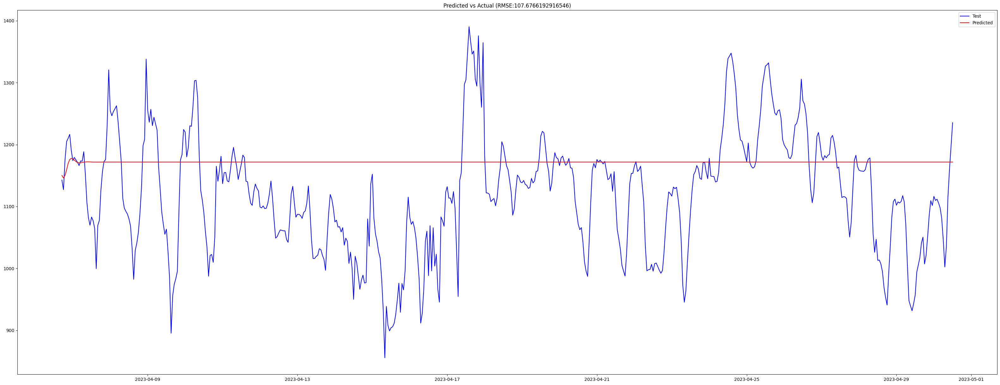

In [393]:
forecast_RT1=model_fit_RT1.forecast(steps=(len(test)))
rmse_RT1=np.sqrt(mean_squared_error(test, forecast_RT1))
print("Test RMSE: %.3f" % rmse_RT1)

plt.figure(figsize=(40, 15))

plt.plot(test.index, test.values ,label="Test", color='blue')
plt.plot(test.index, forecast_RT1,label="Predicted", color='red')
plt.legend()
plt.title(f'Predicted vs Actual (RMSE:{rmse_RT1})')
plt.show()



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2284
Model:                 ARIMA(9, 1, 0)   Log Likelihood              -10118.874
Date:                Thu, 09 Nov 2023   AIC                          20257.747
Time:                        20:16:48   BIC                          20315.080
Sample:                    01-01-2023   HQIC                         20278.658
                         - 04-06-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6015      0.015     40.353      0.000       0.572       0.631
ar.L2         -0.1937      0.019    -10.092      0.000      -0.231      -0.156
ar.L3          0.0012      0.024      0.049      0.9

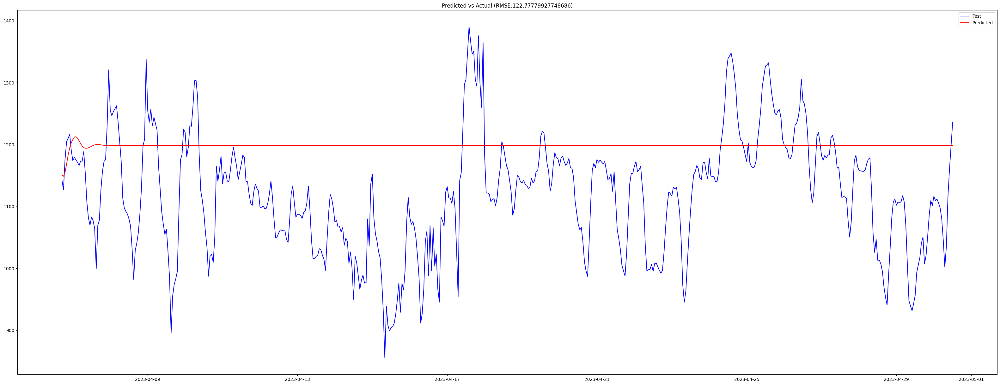

In [394]:
model_RT2=ARIMA(train , order=(9, 1,0))
model_fit_RT2=model_RT2.fit()
print(model_fit_RT2.summary())
forecast_RT2=model_fit_RT2.forecast(steps=(len(test)))
rmse_RT2=np.sqrt(mean_squared_error(test, forecast_RT2))
print("Test RMSE: %.3f" % rmse_RT2)


plt.figure(figsize=(40, 15))
plt.plot(test.index, test.values ,label="Test", color='blue')
plt.plot(test.index, forecast_RT2,label="Predicted", color='red')
plt.legend()
plt.title(f'Predicted vs Actual (RMSE:{rmse_RT2})')
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2284
Model:                ARIMA(14, 1, 0)   Log Likelihood              -10103.282
Date:                Thu, 09 Nov 2023   AIC                          20236.563
Time:                        20:16:49   BIC                          20322.562
Sample:                    01-01-2023   HQIC                         20267.929
                         - 04-06-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5951      0.015     39.578      0.000       0.566       0.625
ar.L2         -0.1912      0.019     -9.915      0.000      -0.229      -0.153
ar.L3         -0.0046      0.024     -0.190      0.8

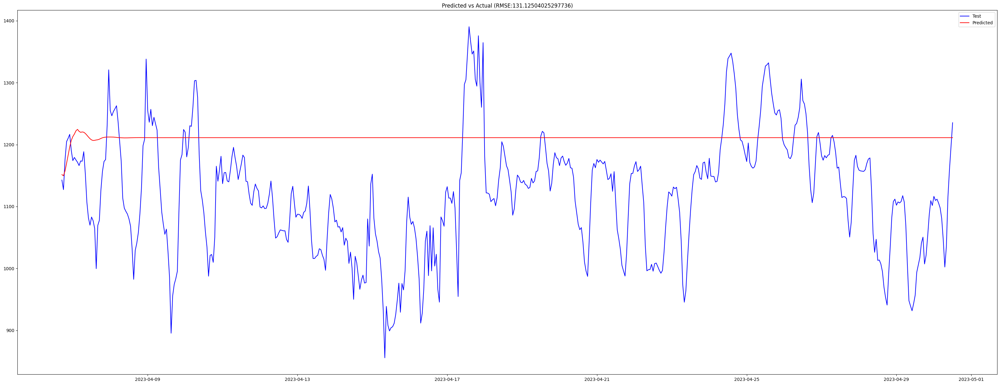

In [395]:
model_RT3=ARIMA(train , order=(14, 1,0))
model_fit_RT3=model_RT3.fit()
print(model_fit_RT3.summary())
forecast_RT3=model_fit_RT3.forecast(steps=(len(test)))
rmse_RT3=np.sqrt(mean_squared_error(test, forecast_RT3))
print("Test RMSE: %.3f" % rmse_RT3)

plt.figure(figsize=(40, 15))
plt.plot(test.index, test.values ,label="Test", color='blue')
plt.plot(test.index, forecast_RT3,label="Predicted", color='red')
plt.legend()
plt.title(f'Predicted vs Actual (RMSE:{rmse_RT3})')
plt.show()



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 2284
Model:                 ARIMA(4, 1, 0)   Log Likelihood              -10140.804
Date:                Thu, 09 Nov 2023   AIC                          20291.608
Time:                        20:16:50   BIC                          20320.274
Sample:                    01-01-2023   HQIC                         20302.064
                         - 04-06-2023                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6231      0.014     45.145      0.000       0.596       0.650
ar.L2         -0.1875      0.019     -9.901      0.000      -0.225      -0.150
ar.L3          0.0209      0.023      0.893      0.3

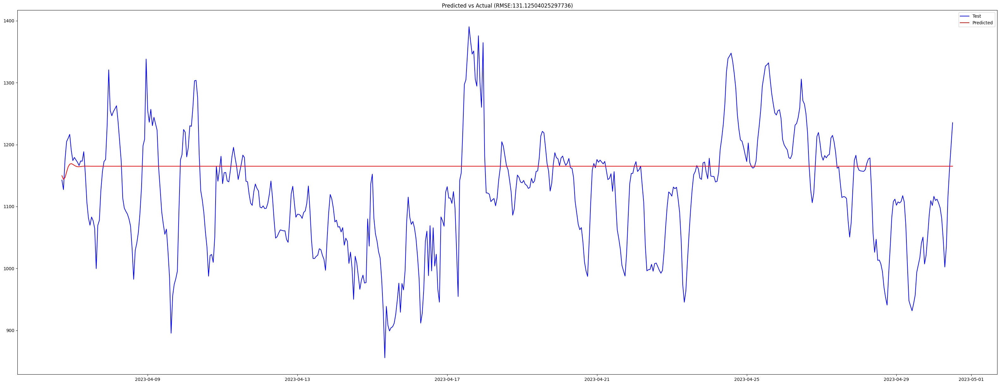

In [396]:
model_RT4=ARIMA(train , order=(4,1,0))
model_fit_RT4=model_RT4.fit()
print(model_fit_RT4.summary())
forecast_RT3=model_fit_RT4.forecast(steps=(len(test)))
rmse_RT4=np.sqrt(mean_squared_error(test, forecast_RT3))
print("Test RMSE: %.3f" % rmse_RT4)

plt.figure(figsize=(40, 15))
plt.plot(test.index, test.values ,label="Test", color='blue')
plt.plot(test.index, forecast_RT3,label="Predicted", color='red')
plt.legend()
plt.title(f'Predicted vs Actual (RMSE:{rmse_RT3})')
plt.show()

<Figure size 640x480 with 0 Axes>

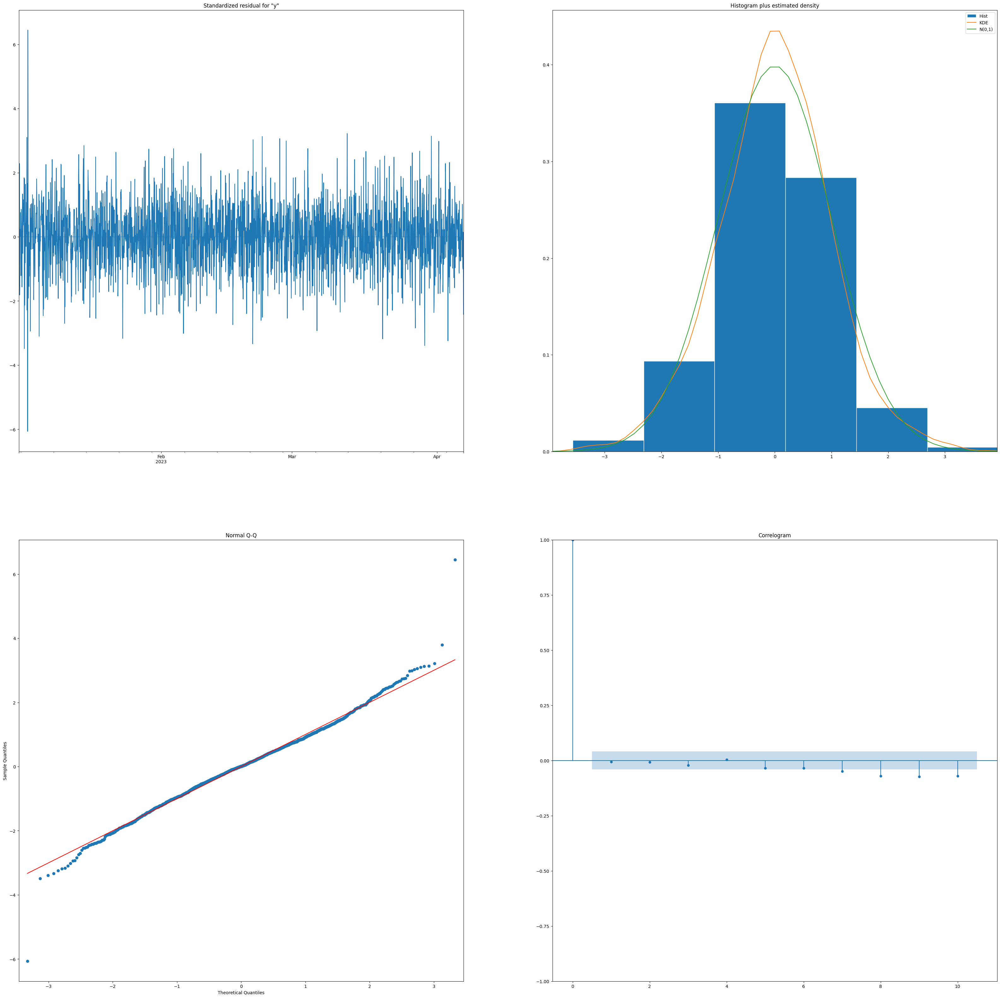

In [397]:
plt.figure()
model_fit_RT4.plot_diagnostics(figsize=(40,40))
plt.show()


AUTO_ARIMA

In [398]:
model_ME = pm.auto_arima(train,
                           seasonal=False,
                            trace=True,
                           error_action='ignore',
                           suppress_warnings=True,
                           stepwise=True, test ='kpss' )

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=20223.701, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=21180.874, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=20421.535, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=20418.672, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=21178.875, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=20342.615, Time=0.62 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=20244.701, Time=1.05 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=20223.415, Time=1.79 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=20226.190, Time=1.77 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=20225.313, Time=2.24 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=20225.348, Time=3.06 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=20224.398, Time=1.64 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=20226.066, Time=2.00 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=20227.197, Time=3.78 sec
 ARIMA(3,1,2)(0,0,0

In [399]:
model_ME.bic()

20255.815442240415

In [400]:
model_ME.aic()

20221.415968361238

In [401]:
model_ME.fit(train)

ARIMA(order=(3, 1, 2), scoring_args={}, suppress_warnings=True,
      with_intercept=False)

Residuals. It's weird that we there is spike in 1st residual

In [402]:
model_ME.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2284
Model:               SARIMAX(3, 1, 2)   Log Likelihood              -10104.708
Date:                Thu, 09 Nov 2023   AIC                          20221.416
Time:                        20:17:19   BIC                          20255.815
Sample:                    01-01-2023   HQIC                         20233.962
                         - 04-06-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0610      0.144      7.373      0.000       0.779       1.343
ar.L2         -0.0467      0.213     -0.220      0.826      -0.464       0.370
ar.L3         -0.1711      0.091     -1.889      0.059      -0.349       0.006
ma.L1         -0.4760      0.144     -3.295      0.001      -0.759      -0.193
ma.L2         -0.4395      0.132     -3.330      0.001      -0.698      -0.181
sigma2       409.0361      9.664     42.327      0.000     390.096     427.977
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               274.34
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               0.84   Skew:                             0.05
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

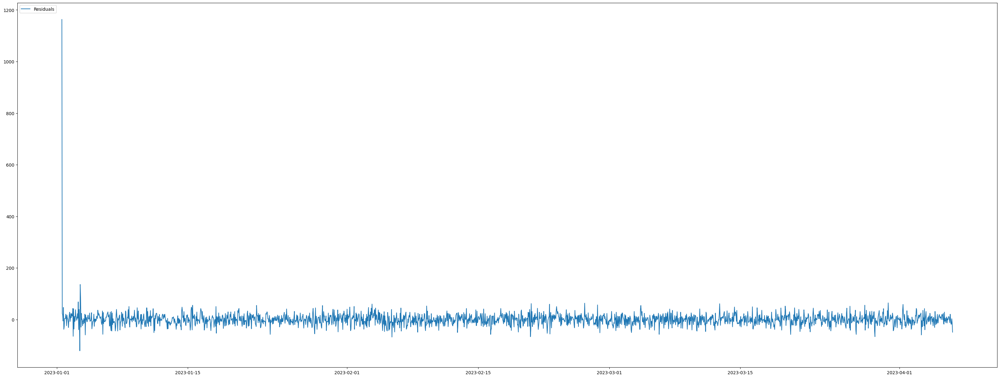

datetime
2023-01-01 13:00:00    1162.887231
2023-01-01 14:00:00      23.186318
2023-01-01 15:00:00      18.379746
2023-01-01 16:00:00      -5.476351
2023-01-01 17:00:00      47.159422
                          ...     
2023-04-06 12:00:00     -17.223114
2023-04-06 13:00:00     -18.149141
2023-04-06 14:00:00       3.124118
2023-04-06 15:00:00     -14.150829
2023-04-06 16:00:00     -48.823237
Length: 2284, dtype: float64

<Figure size 640x480 with 0 Axes>

In [403]:
plt.figure(figsize=(40, 15))
plt.plot(model_ME.resid(),label="Residuals")
plt.legend(loc = 'upper left')
plt.show()
plt.figure()
model_ME.resid()

<Figure size 640x480 with 0 Axes>

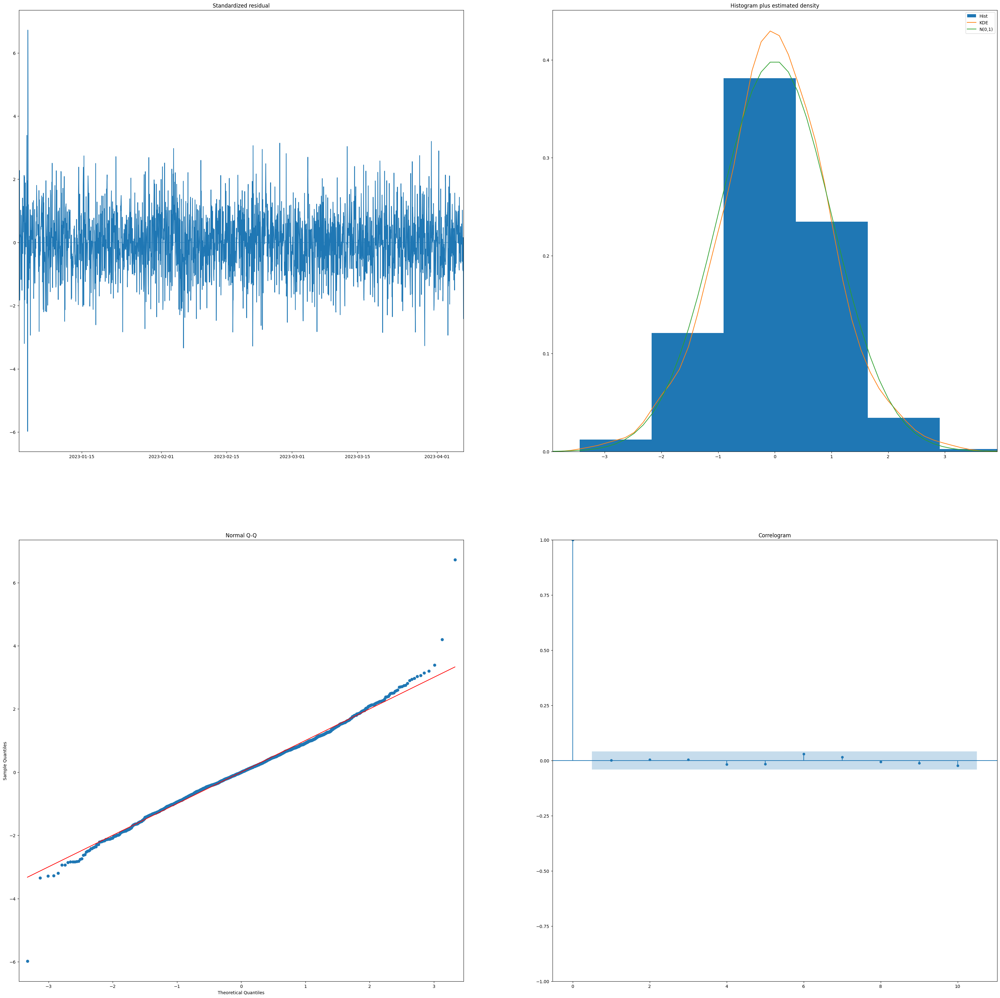

In [404]:
plt.figure()
model_ME.plot_diagnostics(figsize=(40,40))
plt.show()

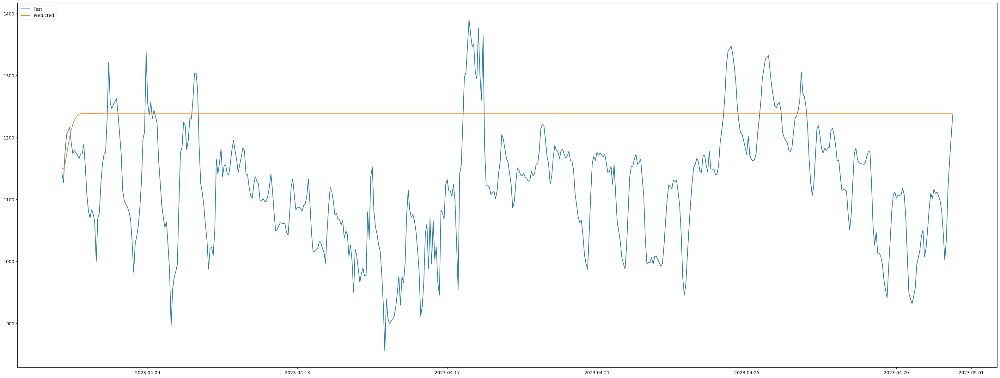

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [405]:

auto_arima_ME = model_ME.predict(n_periods = test.shape[0])
auto_arima_ME.columns = ['Predicted Demand']
plt.figure(figsize=(40, 15))
plt.plot(test,label="Test")
plt.plot(auto_arima_ME,label="Predicted")
plt.legend(loc = 'upper left')
plt.show()
plt.figure()

Rolling ARIMA


In [406]:
test

datetime
2023-04-06 17:00:00    1142.742896
2023-04-06 18:00:00    1127.260494
2023-04-06 19:00:00    1175.719866
2023-04-06 20:00:00    1204.856440
2023-04-06 21:00:00    1210.195815
                          ...     
2023-04-30 08:00:00    1035.516090
2023-04-30 09:00:00    1115.316563
2023-04-30 10:00:00    1159.944579
2023-04-30 11:00:00    1197.807572
2023-04-30 12:00:00    1235.326982
Length: 572, dtype: float64

In [407]:


history = [x for x in train]
predictions = []
for t in range(len(test)):
	model1 = ARIMA(history, order=(3,1,2))
	model_fit1 = model1.fit()
	output = model_fit1.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))

predicted=1150.716573, expected=1142.742896
predicted=1136.033731, expected=1127.260494
predicted=1129.892408, expected=1175.719866
predicted=1216.077204, expected=1204.856440
predicted=1221.406617, expected=1210.195815
predicted=1216.355016, expected=1216.515544
predicted=1222.861046, expected=1190.614551
predicted=1177.222406, expected=1174.117262
predicted=1172.390356, expected=1179.213765
predicted=1187.947647, expected=1175.155316
predicted=1176.506885, expected=1171.460880
predicted=1174.875124, expected=1166.125135
predicted=1167.710185, expected=1173.529203
predicted=1183.334486, expected=1173.120719
predicted=1175.552919, expected=1188.520688
predicted=1201.916562, expected=1153.200090
predicted=1132.620473, expected=1107.062563
predicted=1090.637497, expected=1081.654579
predicted=1078.388795, expected=1069.789572
predicted=1074.260420, expected=1082.966982
predicted=1101.463507, expected=1077.148231
predicted=1080.084389, expected=1064.534938
predicted=1067.169873, expected=

In [408]:
test

datetime
2023-04-06 17:00:00    1142.742896
2023-04-06 18:00:00    1127.260494
2023-04-06 19:00:00    1175.719866
2023-04-06 20:00:00    1204.856440
2023-04-06 21:00:00    1210.195815
                          ...     
2023-04-30 08:00:00    1035.516090
2023-04-30 09:00:00    1115.316563
2023-04-30 10:00:00    1159.944579
2023-04-30 11:00:00    1197.807572
2023-04-30 12:00:00    1235.326982
Length: 572, dtype: float64

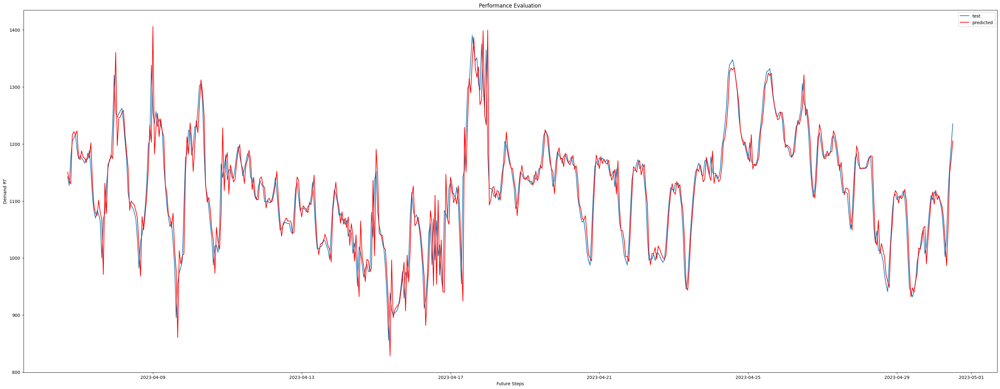

In [409]:
# plot
plt.figure(figsize=(40, 15))
plt.plot(test.index, test, label = 'test')
plt.plot(test.index,predictions, color='red', label = 'predicted')
plt.title('Performance Evaluation')
plt.xlabel('Future Steps')
plt.ylabel('Demand RT')
plt.legend()
plt.show()

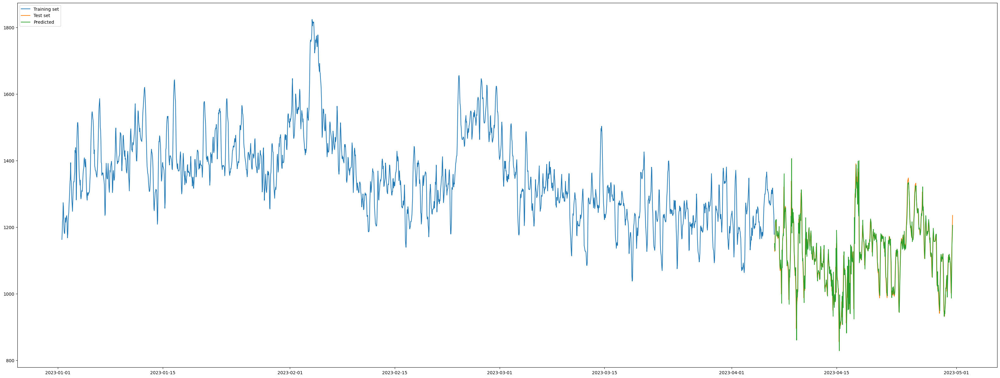

In [410]:
plt.figure(figsize=(40,15))
plt.plot(train.index, train.values, label="Training set")
plt.plot(test.index,test.values,label="Test set")
plt.plot(test.index,predictions,label="Predicted")
plt.legend(loc = 'upper left')
plt.show()


In [411]:
rmse_predicted=np.sqrt(mean_squared_error(test,predictions ))
rmse_predicted

34.773973259569345

RETURN BACK SEASONAL COMPONENT

In [412]:
seasonal

datetime
2023-01-01 01:00:00   -182.325765
2023-01-01 02:00:00   -205.095316
2023-01-01 03:00:00   -211.364880
2023-01-01 04:00:00   -203.998135
2023-01-01 05:00:00   -171.433203
                          ...    
2023-04-30 20:00:00    150.960560
2023-04-30 21:00:00     94.335185
2023-04-30 22:00:00     13.006456
2023-04-30 23:00:00    -68.245551
2023-05-01 00:00:00   -136.162262
Name: seasonal, Length: 2880, dtype: float64

In [413]:
nonseasonal_ME

datetime
2023-01-01 01:00:00   NaN
2023-01-01 02:00:00   NaN
2023-01-01 03:00:00   NaN
2023-01-01 04:00:00   NaN
2023-01-01 05:00:00   NaN
                       ..
2023-04-30 20:00:00   NaN
2023-04-30 21:00:00   NaN
2023-04-30 22:00:00   NaN
2023-04-30 23:00:00   NaN
2023-05-01 00:00:00   NaN
Length: 2880, dtype: float64

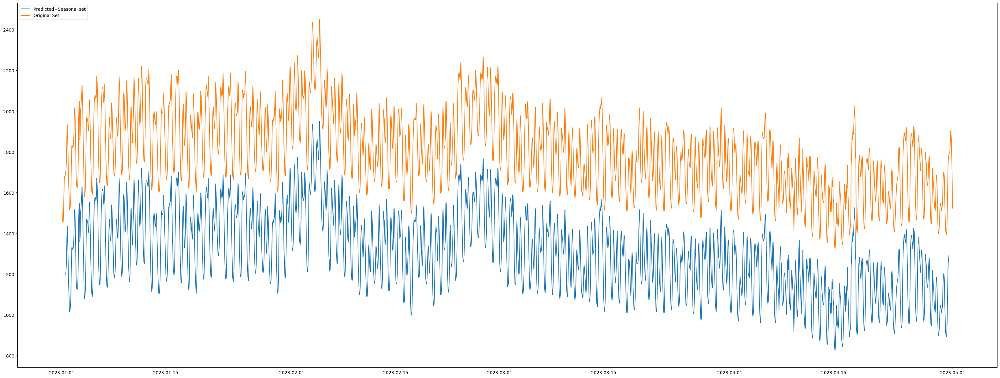

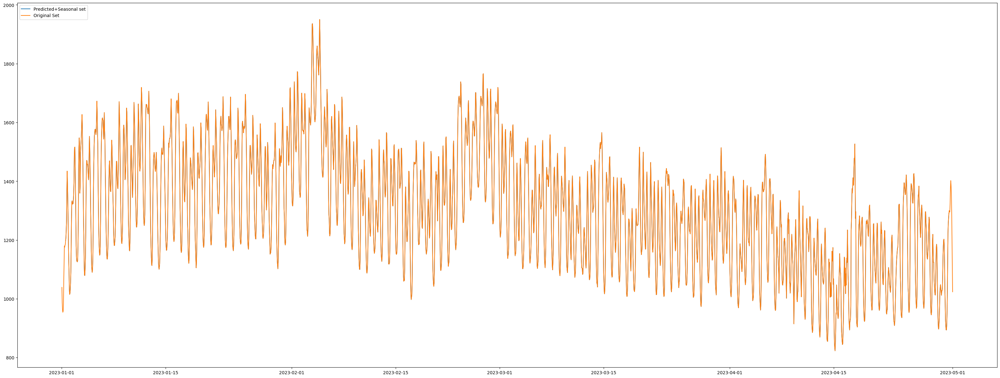

In [414]:
full_ME=seasonal+nonseasonal_ME

plt.figure(figsize=(40,15))
plt.plot(plot_demand_RT["RT_D_ME"].index, full_ME.values, label="Predicted+Seasonal set")
plt.plot(plot_demand_RT["RT_D_ME"].index, plot_demand_RT["RT_D_ME"].values+500, label="Original Set")
plt.legend(loc = 'upper left')
plt.show()

plt.figure(figsize=(40,15))
plt.plot(plot_demand_RT["RT_D_ME"].index, full_ME.values, label="Predicted+Seasonal set")
plt.plot(plot_demand_RT["RT_D_ME"].index, plot_demand_RT["RT_D_ME"].values, label="Original Set")
plt.legend(loc = 'upper left')
plt.show()

RMSE AFTER SEASONAL COMPONENT WAS ADDDED

Trim values of plot_demand_RT to align with trimmed predicted values

In [415]:
num_nan_at_end = full_ME.iloc[-100:].isna().sum()
num_nan_at_start=full_ME.iloc[:100].isna().sum()
plot_demand_RT_trimmed = plot_demand_RT["RT_D_ME"].iloc[12:-12]
plot_demand_RT_trimmed

datetime
2023-01-01 13:00:00    1198.572
2023-01-01 14:00:00    1207.776
2023-01-01 15:00:00    1236.538
2023-01-01 16:00:00    1269.458
2023-01-01 17:00:00    1369.685
                         ...   
2023-04-30 08:00:00    1127.281
2023-04-30 09:00:00    1223.781
2023-04-30 10:00:00    1257.459
2023-04-30 11:00:00    1275.347
2023-04-30 12:00:00    1290.417
Name: RT_D_ME, Length: 2856, dtype: float64

In [416]:
rmse_full=np.sqrt(mean_squared_error(plot_demand_RT_trimmed.values,full_ME.dropna().values))
rmse_full

4.50266972155384e-14

ADDING EXOGENEOUS VARIABLE- WEATHER IMPACT


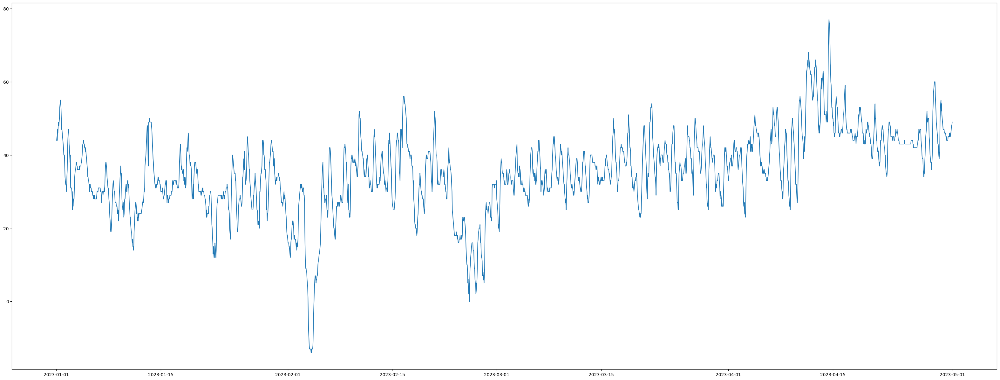

In [417]:
ptdrybulb["Dry_Bulb_ME"]
plt.figure(figsize=(40,15))
plt.plot(ptdrybulb["Dry_Bulb_ME"])


In [418]:
train


datetime
2023-01-01 13:00:00    1162.887231
2023-01-01 14:00:00    1186.460938
2023-01-01 15:00:00    1217.298001
2023-01-01 16:00:00    1226.796470
2023-01-01 17:00:00    1273.538896
                          ...     
2023-04-06 12:00:00    1299.552982
2023-04-06 13:00:00    1268.052231
2023-04-06 14:00:00    1253.644938
2023-04-06 15:00:00    1235.247001
2023-04-06 16:00:00    1178.327470
Length: 2284, dtype: float64

In [419]:
exog_1=ptdrybulb["Dry_Bulb_ME"].iloc[12:2296]
exog_1

datetime
2023-01-01 13:00:00    55
2023-01-01 14:00:00    54
2023-01-01 15:00:00    53
2023-01-01 16:00:00    50
2023-01-01 17:00:00    47
                       ..
2023-04-06 12:00:00    38
2023-04-06 13:00:00    40
2023-04-06 14:00:00    41
2023-04-06 15:00:00    44
2023-04-06 16:00:00    44
Name: Dry_Bulb_ME, Length: 2284, dtype: int64

In [420]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
model_EX = SARIMAX(train, exog_1, order=(3,1,2),seasonal_order=(0,0,0,0),enforce_invertibility=False)
results_EX = model_EX.fit()
results_EX.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2284
Model:               SARIMAX(3, 1, 2)   Log Likelihood              -10086.138
Date:                Thu, 09 Nov 2023   AIC                          20186.276
Time:                        20:25:54   BIC                          20226.408
Sample:                    01-01-2023   HQIC                         20200.913
                         - 04-06-2023                                         
Covariance Type:                  opg                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Dry_Bulb_ME    -1.5741      0.240     -6.561      0.000      -2.044      -1.104
ar.L1           0.9763      0.136      7.163      0.000       0.709       1.243
ar.L2           0.0645      0.200      0.322      0.748      -0.328       0.457
ar.L3          -0.2148      0.086     -2.512      0.012      -0.382      -0.047
ma.L1          -0.4203      0.137     -3.064      0.002      -0.689      -0.151
ma.L2          -0.4999      0.127     -3.950      0.000      -0.748      -0.252
sigma2        402.4327      9.582     42.000      0.000     383.653     421.212
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               246.27
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.81   Skew:                             0.09
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.60
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [421]:
test.shape[0]

572

In [422]:
start = len(train)
end = len(train)+len(test)-1

In [423]:
end

2855

In [424]:
exog_1

datetime
2023-01-01 13:00:00    55
2023-01-01 14:00:00    54
2023-01-01 15:00:00    53
2023-01-01 16:00:00    50
2023-01-01 17:00:00    47
                       ..
2023-04-06 12:00:00    38
2023-04-06 13:00:00    40
2023-04-06 14:00:00    41
2023-04-06 15:00:00    44
2023-04-06 16:00:00    44
Name: Dry_Bulb_ME, Length: 2284, dtype: int64

In [425]:
train

datetime
2023-01-01 13:00:00    1162.887231
2023-01-01 14:00:00    1186.460938
2023-01-01 15:00:00    1217.298001
2023-01-01 16:00:00    1226.796470
2023-01-01 17:00:00    1273.538896
                          ...     
2023-04-06 12:00:00    1299.552982
2023-04-06 13:00:00    1268.052231
2023-04-06 14:00:00    1253.644938
2023-04-06 15:00:00    1235.247001
2023-04-06 16:00:00    1178.327470
Length: 2284, dtype: float64

In [426]:
model_EX_auto = pm.auto_arima(train, exog=exog_1,
                           seasonal=False,
                            trace=True,
                           error_action='ignore',
                           suppress_warnings=True,
                           stepwise=True, test ='kpss' )

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=20223.701, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=21180.874, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=20421.535, Time=0.23 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=20418.672, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=21178.875, Time=0.05 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=20342.615, Time=0.62 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=20244.701, Time=1.04 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=20223.415, Time=1.74 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=20226.190, Time=1.75 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=20225.313, Time=2.26 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=20225.348, Time=3.16 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=20224.398, Time=1.69 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=20226.066, Time=2.00 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=20227.197, Time=3.76 sec
 ARIMA(3,1,2)(0,0,0

In [427]:
model_EX_auto.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 2284
Model:               SARIMAX(3, 1, 2)   Log Likelihood              -10104.708
Date:                Thu, 09 Nov 2023   AIC                          20221.416
Time:                        20:26:21   BIC                          20255.815
Sample:                    01-01-2023   HQIC                         20233.962
                         - 04-06-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0610      0.144      7.373      0.000       0.779       1.343
ar.L2         -0.0467      0.213     -0.220      0.826      -0.464       0.370
ar.L3         -0.1711      0.091     -1.889      0.059      -0.349       0.006
ma.L1         -0.4760      0.144     -3.295      0.001      -0.759      -0.193
ma.L2         -0.4395      0.132     -3.330      0.001      -0.698      -0.181
sigma2       409.0361      9.664     42.327      0.000     390.096     427.977
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               274.34
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               0.84   Skew:                             0.05
Prob(H) (two-sided):                  0.01   Kurtosis:                         4.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [428]:
exog_1

datetime
2023-01-01 13:00:00    55
2023-01-01 14:00:00    54
2023-01-01 15:00:00    53
2023-01-01 16:00:00    50
2023-01-01 17:00:00    47
                       ..
2023-04-06 12:00:00    38
2023-04-06 13:00:00    40
2023-04-06 14:00:00    41
2023-04-06 15:00:00    44
2023-04-06 16:00:00    44
Name: Dry_Bulb_ME, Length: 2284, dtype: int64

FORECAST

In [434]:
#predict_EX =  results_EX.predict(start=start,end=end,exog=exog_forecast)
#rmse_EX=np.sqrt(mean_squared_error(test,predict_EX))
#print("Test RMSE: %.3f" % rmse_EX)


start = len(train)    #1st point of the data to extract from exogeneous variable datagrame
end = len(train)+len(test)-1  # last point to extract from exageneous variable dataframe
exog_forecast = ptdrybulb["Dry_Bulb_ME"].iloc[start:end+1]  #extract data for forecast from exogeneous variable

history2 = [x for x in train]    #extract data from training data set and store in new variable
predictions2 = []   #create dataset to store predictions
for t in range(len(test)):  # iterate over the number of points in test
  exog_forecast_1 = ptdrybulb["Dry_Bulb_ME"].iloc[start+t:start+t+1].values.reshape(-1, 1)  #for each t extract value t and store in temporary variable. exog_forecast_1 is reshaped using .reshape(-1, 1) to convert it into a 2D array with one column.
  model2 = SARIMAX(endog=train, exog=exog_1, order=(3,1,2),seasonal_order=(0,0,0,0),enforce_invertibility=False)   # obtain ARIMAX model
  model_fit2 = model2.fit()
  output2 = model_fit2.forecast(steps=1,exog=exog_forecast_1)  #forecast using obtained model and extracted exog_variable
  yhat2 = output2[0]  #store output value in yhat
  predictions2.append(yhat2)  #append yhat to predictions array
  obs2 = test[t]              #save observation value from test at particular step t for comparison with predicted value
  history2.append(obs2)       #append test values for future comparison
  print('predicted=%f, expected=%f' % (yhat2, obs2))  # print every prediction
  #print('exog',exog_forecast_1)
  #print('t',t)



/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=1142.742896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=1127.260494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1166.658880, expected=1175.719866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1166.658880, expected=1204.856440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1210.195815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1163.510589, expected=1216.515544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1161.936444, expected=1190.614551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=1174.117262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1179.213765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1175.155316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1171.460880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1166.125135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1173.529203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1173.120719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1188.520688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1153.200090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1107.062563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1081.654579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1069.789572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1082.966982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1077.148231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1064.534938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=999.625001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1069.477470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1077.623896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1126.560494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1156.825866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1172.781440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1175.788815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1230.691544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1320.721551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1254.683262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1246.531765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1253.279316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1257.825880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1262.724135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1237.146203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1205.466719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1173.710688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1113.444090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1097.344563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=1092.200579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1163.510589, expected=1087.706572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1079.908982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=1068.338231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=1032.114938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=982.397001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1171.381316, expected=1029.084470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1172.955461, expected=1040.706896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1172.955461, expected=1057.957494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1176.103751, expected=1088.162866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1176.103751, expected=1129.742440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=1198.231815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1163.510589, expected=1208.382544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1161.936444, expected=1338.102551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1254.841262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1236.106765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1256.914316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1230.538880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1244.047135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1233.720203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1223.490719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1163.292688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1127.588090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1090.932563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=1071.498579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1055.050572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=1063.467982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1168.233025, expected=1027.537231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1169.807170, expected=985.540938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1174.529606, expected=895.354001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1176.103751, expected=955.728470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1179.252042, expected=974.252896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1177.677897, expected=983.309494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1180.826187, expected=995.288866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1179.252042, expected=1090.721440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1169.807170, expected=1175.191815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1183.851544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1224.331551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1220.150262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1180.127765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1195.048316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1230.393880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1229.502135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1260.889203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1303.037719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1303.754688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1276.119090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1184.494563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1125.596579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1161.936444, expected=1110.397572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1089.771982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1169.807170, expected=1058.825231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1169.807170, expected=1034.324938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1169.807170, expected=987.472001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1172.955461, expected=1020.992470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1176.103751, expected=1022.470896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1177.677897, expected=1009.819494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1176.103751, expected=1050.693866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1171.381316, expected=1165.037440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1163.510589, expected=1140.829815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1158.707544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1181.123551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1136.891262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1154.555765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1154.958316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1132.027684, expected=1141.216880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1139.801135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1158.284203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1180.324719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1195.544688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1178.930090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1164.808563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1143.630579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1156.103572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1168.551982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1182.993231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1179.080938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1140.753001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1139.930470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1120.192896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1105.356494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1101.852866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1123.744440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1136.324815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1129.369544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1127.305248, expected=1125.129551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1121.008667, expected=1099.170262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1121.008667, expected=1097.726765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1119.434522, expected=1100.988316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1117.860377, expected=1096.606880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1116.286231, expected=1097.119135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1119.434522, expected=1105.322203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1113.137941, expected=1120.098719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1114.712086, expected=1141.134688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1116.286231, expected=1114.451090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1117.860377, expected=1078.721563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1119.434522, expected=1048.979579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1121.008667, expected=1051.299572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1121.008667, expected=1057.275982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1122.582812, expected=1062.215231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1122.582812, expected=1061.500938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1122.582812, expected=1060.683001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1060.761470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1128.879394, expected=1046.699896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1130.453539, expected=1042.124494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1077.686866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1120.600440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1132.027684, expected=1132.650815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1132.027684, expected=1105.959544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1128.879394, expected=1082.735551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1087.479262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1122.582812, expected=1087.274765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1119.434522, expected=1085.389316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1119.434522, expected=1080.805880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1119.434522, expected=1090.461135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1116.286231, expected=1092.851203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1117.860377, expected=1105.303719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1119.434522, expected=1133.121688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1124.156958, expected=1094.690090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1127.305248, expected=1045.737563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1130.453539, expected=1016.028579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1016.041572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1019.401982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1021.324231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1031.767938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1030.321001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1021.241470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1014.561896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=996.967494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1047.231866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1089.624440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1119.410815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1128.879394, expected=1112.309544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1097.497551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1124.156958, expected=1075.119262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1128.879394, expected=1077.897765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1066.760316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1124.156958, expected=1067.403880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1124.156958, expected=1058.853135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1121.008667, expected=1065.859203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1122.582812, expected=1037.507719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1127.305248, expected=1048.781688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1043.716090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1008.134563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1026.278579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1000.540572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=950.064982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1019.552231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1008.949938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=987.772001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=966.285470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=980.953896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=989.149494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=976.356866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=977.168440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1079.943815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1109.989650, expected=1036.018544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1103.693069, expected=1136.451551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1098.970634, expected=1152.213262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1100.544779, expected=1081.177765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1100.544779, expected=1055.873316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1106.841360, expected=1044.247880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1117.860377, expected=1026.957135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1121.008667, expected=1016.767203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=981.970719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1127.305248, expected=932.060688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1132.027684, expected=855.602090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=938.690563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=908.099579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=898.997572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=904.206982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=905.753231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=911.330938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=925.821001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=948.707470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=976.200896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=929.196494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=975.607866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=965.236440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=996.306815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1074.477544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1132.027684, expected=1115.198551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1082.732262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1071.171765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1075.826316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1065.643880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1048.168135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1018.771203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=982.780719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=911.685688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=927.503090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=967.142563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1044.200579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1060.208572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=988.326982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1069.018231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=995.963938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1065.645001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1003.797470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1022.882896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=966.021494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=945.500866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1083.160440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1077.010815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1068.136544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1123.076551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1132.022262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1113.616765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1132.027684, expected=1113.622316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1128.879394, expected=1105.064880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1127.305248, expected=1124.107135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1097.575203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1029.899719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=954.596688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1142.010090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1154.429563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1221.802579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1297.215572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1304.776982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1346.652231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1390.343938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1366.547001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1346.147470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1351.206896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1305.409494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1294.364866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1375.781440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1300.443815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1260.192544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1364.662551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1181.598262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1121.989765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1121.681316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1119.844880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1107.883135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1110.821203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1112.873719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1101.181688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1114.001090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1142.733563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1162.198579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1204.602572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1197.167982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1181.674231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1165.836938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1159.433001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1142.054470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1123.229896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1085.995494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1096.370866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1126.708440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1150.744815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1147.127544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1139.575551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1138.312262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1142.031765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1135.848316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1134.173880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1129.208135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1136.750120, expected=1130.777203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1145.454719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1138.087688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1141.370090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1156.586563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1157.537579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1178.468572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1213.785982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1221.354231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1218.955938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1195.641001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1169.730470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1157.210896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1124.960494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1137.284866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1167.919440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1186.912815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1178.869544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1177.045551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1166.040262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1178.384765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1181.461316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1172.537880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1166.558135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1170.111203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1177.638719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1162.612688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1161.738090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1147.080563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1108.586579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1089.782572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1071.120982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1062.614231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1065.926938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1042.877001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1010.626470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=995.869896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=987.128494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1043.175866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1106.355440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1158.858815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1169.516544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1162.613551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1175.864262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1171.420765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1174.963316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1171.777880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1168.795135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1172.799203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1158.593719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1143.516688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1145.373090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1152.901563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1124.505579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1156.323572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1108.711982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1062.586231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1048.043938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1030.965001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1005.157470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=996.104896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1161.936444, expected=987.705494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=1023.773866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=1081.447440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1136.576815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1153.327544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1153.543551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1165.336262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1172.461765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1156.583316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1159.349880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1165.125135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1134.609203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1105.984719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1036.303688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=996.140090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=997.928563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=998.213579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1006.601572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=995.489982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1007.810231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1161.936444, expected=1008.642938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1163.510589, expected=1002.835001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=996.844470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=992.249896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1166.658880, expected=996.758494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1026.105866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=1065.864440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1099.716815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1123.504544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1120.861551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1116.759262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1131.444765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1128.705316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1131.090880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1112.581135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1090.684203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1044.968719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=973.445688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=945.446090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=963.768563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1011.110579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1053.893572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1093.056982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1126.371231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1151.322938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1156.422001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1166.120470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1160.825896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1145.663494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1143.779866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1170.380440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1171.824815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1155.655544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1144.881551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1177.873262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1149.117765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1148.616316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1148.489880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1139.621135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1140.622203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1155.295719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1191.989688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1210.557090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1232.811563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1265.547579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1317.070572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1338.980982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1343.108231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1347.697938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1334.654001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1314.870470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1290.933896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1248.732494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1224.618866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1207.528440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1205.455815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1195.641544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1183.679551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1172.610262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1202.594765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1170.893316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1164.591880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1161.918135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1164.090203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1173.624719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1206.828688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1229.908090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1255.993563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1294.126579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1310.589572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1326.791982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1328.906231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1332.053938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1306.364001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1282.816470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1266.084896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1251.172494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1247.742866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1254.622440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1256.246815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1242.543544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1208.401551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1199.685262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1195.206765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1191.529316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1178.975880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1177.334135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1183.452203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1208.459719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1231.399688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1234.108090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1243.784563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1259.535579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1305.821572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1270.958982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1265.539231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1249.682938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1219.183001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1165.893470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1127.537896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1106.173494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1121.730866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1168.009440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1213.092815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1219.518544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1202.464551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1181.814262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1174.796765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1182.220316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1178.615880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1182.586135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1184.085203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1210.686719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1214.844688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1204.491090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1187.328563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1161.867579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1163.718572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1137.632982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1114.510231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1115.926938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1163.510589, expected=1115.533001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1112.918470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1166.658880, expected=1077.042896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1050.642494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1165.084735, expected=1074.642866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=1126.802440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1174.542815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1182.677544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1164.733551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1158.674262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1157.483765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1157.104316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1156.701880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1159.432135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1169.596203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1176.650719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1178.462688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1127.428090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1056.593563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1026.019579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1150.917427, expected=1047.072572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1013.035982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1013.515231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1007.232938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=995.016001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=969.726470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=953.262896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1163.510589, expected=940.816494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1160.362299, expected=990.907866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1034.519440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=1082.220815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1107.830544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1111.886551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1130.453539, expected=1102.083262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1128.879394, expected=1107.444765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1127.305248, expected=1105.689316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1108.037880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1117.474135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1125.731103, expected=1107.156203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1132.027684, expected=1069.661719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1006.216688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=947.948090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=939.391563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=931.600579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=943.035572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=956.679982


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1149.343282, expected=993.626231


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1005.632938


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1152.491572, expected=1017.442001


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1154.065718, expected=1040.976470


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1050.470896


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1158.788154, expected=1007.190494


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1157.214008, expected=1021.168866


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1155.639863, expected=1051.813440


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1086.126815


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1109.467544


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1101.607551


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1133.601829, expected=1116.356262


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1138.324265, expected=1109.751765


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1135.175975, expected=1111.818316


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1139.898410, expected=1105.599880


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1141.472556, expected=1097.713135


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1143.046701, expected=1080.755203


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1144.620846, expected=1046.109719


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1002.241688


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1035.516090


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1115.316563


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1146.194991, expected=1159.944579


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1197.807572


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



predicted=1147.769137, expected=1235.326982


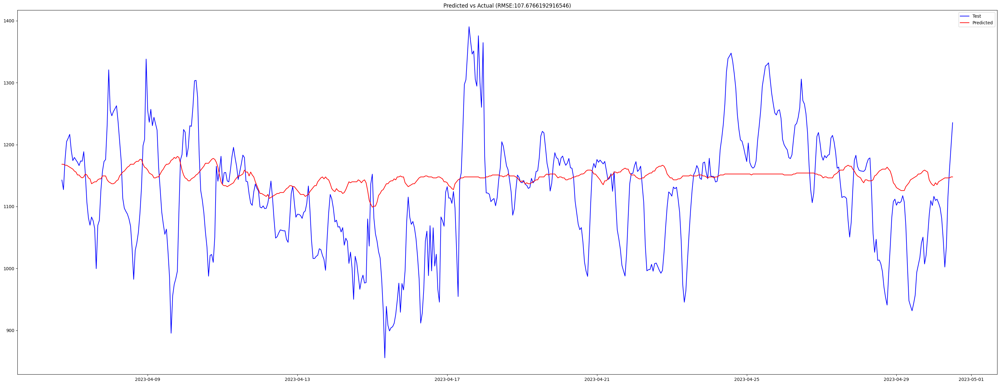

In [435]:
plt.figure(figsize=(40, 15))
plt.plot(test.index, test.values , label="Test", color='blue')
plt.plot(test.index, predictions2 ,label="Predicted", color='red')
plt.legend()
plt.title(f'Predicted vs Actual (RMSE:{rmse_RT1})')
plt.show()


In [ ]:
plt.figure(figsize=(40,15))
plt.plot(predictions_ex.index, predictions_ex.values, label="Predictions set")
plt.plot(test.index, test.values, label="Test Set")
plt.legend(loc = 'upper left')
plt.show()

In [ ]:
#def recursive_forecast(endog: Union[pd.Series, list], exog: Union[pd.Series, list], train_len: int, horizon: int, window: int, method: str) -> list:



ANOTHER CODE

In [ ]:
#target_train = target[:196]
#target_test = target[196:]

pred_df = pd.DataFrame({'test': test})
endog=train


train_len = len(train)
horizon = len(test)
window = 1

pred_SARIMAX = []
total_len = train_len + horizon

for i in range(train_len, total_len, window):
  model_EXX = SARIMAX(endog[:i], exog_1[:i], order=(3,1,2), seasonal_order=(0,0,0,0))
  EXX_fit = model_EXX.fit(disp=False)
  predictions_EX = EXX_fit.get_prediction(exog=exog_1)
  oos_pred = predictions_EX.predicted_mean.iloc[-window:]
  pred_SARIMAX.extend(oos_pred)



#pred_SARIMAX = recursive_forecast(target, exog, TRAIN_LEN, HORIZON, WINDOW,
 #'SARIMAX')

pred_df['pred_SARIMAX'] = pred_SARIMAX

GRID SEARCH

In [ ]:
p_values=range(0,10)
d_values=range(0,10)
q_values=range(0,10)
best_rmse=100000
best_order=[]
results = []



In [ ]:
from tqdm import tqdm
import math

p_values=range(0,10)
d_values=range(0,10)
q_values=range(0,10)
best_rmse=100000
best_order=[]
results = []

#for p1 in tqdm(p_values):
 # for d1 in d_values:
  #  for q1 in q_values:
   #   try:

     #   model_grid=ARIMA(train, order=(p1,d1,q1))
      #  model_fit_grid=model_grid.fit()
       # forecast_grid=model_fit_grid.forecast(steps=len(test))
        #rmsegs=np.sqrt(mean_squared_error(test,forecast_grid))
        #results.append((p1,d1,q1,rmsegs))
        #if rmsegs< best_rmse:
        #  best_rmse=rmsegs
         # best_order=(p1,d1,q1)
      #except:
       # continue
 #       forecast_diff

In [ ]:
model = SARIMAX(df1['total'],exog=df1['holiday'],order=(1,0,0),seasonal_order=(2,0,0,7),enforce_invertibility=False)
results = model.fit()
exog_forecast = df[478:][['holiday']] ## forecast into the original dataframe where the values were NaN for visitors
fcast = results.predict(len(df1),len(df1)+38,exog=exog_forecast).rename('SARIMAX(1,0,0)(2,0,0,7) Forecast')